# 🧠 Brain Tumor CT Scan Classification System
### Complete Pipeline: Artifact-Aware Preprocessing → Multiple Models → Grad-CAM → Comparison
**Task:** Binary classification — `Healthy` vs `Tumor`
**Source:** CT scan images (not MRI) — this pipeline includes extra denoising and
artifact-removal steps because CT images commonly contain scanner noise, speckle,
burned-in text/annotations, and inconsistent black borders.
---


## PHASE 1 — Environment Setup

In [1]:
# ============================================================
# 1. Install Required Libraries
# ============================================================
!pip install -q timm
!pip install -q grad-cam==1.4.6
!pip install -q torchmetrics
!pip install -q seaborn
!pip install -q scikit-learn
!pip install -q opencv-python-headless


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 65.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 53.3 MB/s eta 0:00:00


In [2]:
# ============================================================
# 2. Import Core Libraries
# ============================================================
import os
import random
import warnings
import time
from glob import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.models as models
from torchvision import transforms as T
from torch.utils.data import Dataset, DataLoader

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    roc_curve,
    auc,
    roc_auc_score
)

import timm
from tqdm import tqdm
import torchmetrics

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

warnings.filterwarnings("ignore")


In [3]:
# ============================================================
# 3. Reproducibility Seeds
# ============================================================
SEED = 2025
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# benchmark=True lets cuDNN find the fastest kernel for a fixed input size
torch.backends.cudnn.deterministic = False
torch.backends.cudnn.benchmark     = True


In [4]:
# ============================================================
# 4. GPU / Device Configuration
# ============================================================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("=" * 60)
print("DEVICE CONFIGURATION")
print("=" * 60)
print(f"Device Type       : {device}")
if torch.cuda.is_available():
    print(f"GPU Name          : {torch.cuda.get_device_name(0)}")
    print(f"CUDA Version      : {torch.version.cuda}")
    print(f"GPU Memory (GB)   : {round(torch.cuda.get_device_properties(0).total_memory / 1024**3, 2)}")
else:
    print("Running on CPU")


DEVICE CONFIGURATION
Device Type       : cuda
GPU Name          : Tesla T4
CUDA Version      : 12.8
GPU Memory (GB)   : 14.56


In [5]:
# ============================================================
# 5. Global Configuration
# ============================================================
IMG_SIZE    = 176
BATCH_SIZE  = 32
NUM_CLASSES = 2
EPOCHS      = 20

# Binary classes — folder names on Drive must match these exactly
CLASSES = ["Healthy", "Tumor"]

MEAN = [0.485, 0.456, 0.406]
STD  = [0.229, 0.224, 0.225]

print("=" * 60)
print(" PROJECT CONFIGURATION")
print("=" * 60)
print(f"Image Size        : {IMG_SIZE} x {IMG_SIZE}")
print(f"Batch Size        : {BATCH_SIZE}")
print(f"Classes           : {NUM_CLASSES}")
print(f"Class Names       : {CLASSES}")
print(f"Epochs            : {EPOCHS}")
print(f"Mean              : {MEAN}")
print(f"Std               : {STD}")


 PROJECT CONFIGURATION
Image Size        : 176 x 176
Batch Size        : 32
Classes           : 2
Class Names       : ['Healthy', 'Tumor']
Epochs            : 20
Mean              : [0.485, 0.456, 0.406]
Std               : [0.229, 0.224, 0.225]


---
## PHASE 2 — Google Drive Mount & Dataset Paths
> This dataset does **not** come with pre-made `train/`/`test/` folders. It is a
> single root folder with two class subfolders: `Healthy/` and `Tumor/`.
> The train/validation/test split is therefore created *by this notebook*
> (Phase 4) using a **stratified** split, so both classes stay balanced across
> all three sets.


In [6]:
# ============================================================
# 1. Mount Google Drive
# ============================================================
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [7]:
# ============================================================
# 2. Dataset Paths (matches the folder structure given for this project)
# ============================================================
PROJECT_ROOT = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan"
DATASET_ROOT = os.path.join(PROJECT_ROOT, "Brain Tumor CT scan Images")

HEALTHY_DIR = os.path.join(DATASET_ROOT, "Healthy")
TUMOR_DIR   = os.path.join(DATASET_ROOT, "Tumor")

# Local Colab paths for fast training (NOT Drive — Drive/FUSE is slow to read repeatedly)
LOCAL_PROCESSED_DIR = "/content/processed_dataset"
LOCAL_RAW_DIR        = "/content/brain_tumor_ct_raw"
os.makedirs(LOCAL_PROCESSED_DIR, exist_ok=True)

print("Dataset Root Exists :", os.path.exists(DATASET_ROOT))
print("Healthy Dir Exists  :", os.path.exists(HEALTHY_DIR))
print("Tumor   Dir Exists  :", os.path.exists(TUMOR_DIR))

if os.path.exists(HEALTHY_DIR):
    n_healthy = len([f for f in os.listdir(HEALTHY_DIR)
                      if not f.startswith('.')])
    print(f"Healthy images (raw count) : {n_healthy}")
if os.path.exists(TUMOR_DIR):
    n_tumor = len([f for f in os.listdir(TUMOR_DIR)
                    if not f.startswith('.')])
    print(f"Tumor images (raw count)   : {n_tumor}")


Dataset Root Exists : True
Healthy Dir Exists  : True
Tumor   Dir Exists  : True
Healthy images (raw count) : 2300
Tumor images (raw count)   : 2318


---
## PHASE 3 — CT-Specific Preprocessing (Artifact & Noise Handling)
CT scan folders scraped from mixed sources commonly contain:
- **Speckle / Gaussian noise** from low-dose acquisition or re-compression
- **Salt-and-pepper artifacts** from JPEG re-encoding
- **Burned-in scanner text, rulers, or L/R markers** in the corners
- **Black margins** of inconsistent size/position around the skull
- **Inconsistent brightness/contrast** across different scanner sources
- **Corrupt or unreadable files** mixed into the folders

Each of these is handled explicitly below, **before** resizing, so a model
can't accidentally learn to key off a scanner artifact instead of anatomy.


In [8]:
# ============================================================
# 1. Denoising — remove speckle / salt-and-pepper / JPEG-block noise
# ============================================================
def denoise_ct(gray):
    """Removes speckle/Gaussian noise and JPEG-block artifacts common in
    CT scans, while preserving edges (tumor margins, skull boundary).
    Median blur first kills isolated salt-and-pepper pixels; Non-Local-Means
    then smooths speckle without blurring structural edges."""
    denoised = cv2.medianBlur(gray, 3)
    denoised = cv2.fastNlMeansDenoising(denoised, h=8, templateWindowSize=7,
                                         searchWindowSize=21)
    return denoised


# ============================================================
# 2. Contrast Normalization — CLAHE
# ============================================================
def normalize_contrast(gray):
    """CT images pulled from different scanners/sources vary a lot in
    brightness and contrast. CLAHE (adaptive histogram equalization) evens
    this out locally, without blowing out bright regions the way global
    histogram equalization would."""
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return clahe.apply(gray)


# ============================================================
# 3. Artifact / Border Removal — Otsu threshold + largest contour,
#    MASKED via CONVEX HULL (not just cropped, not just filled raw)
# ============================================================
# NOTE (v1): An earlier version of this function only took the bounding
# RECTANGLE of the largest contour. That is not enough on its own —
# several scans have a skull that already fills most of the frame, so
# burned-in scanner text/markers (e.g. an "F" ROI box, "HEAD" label,
# patient info) sitting in the frame corners still fall INSIDE that
# bounding rectangle and survive a plain crop.
#
# NOTE (v2 bugfix): Filling the RAW largest contour (not its hull) can
# blank out the entire brain interior on some scans. Otsu sometimes only
# binarizes the bright bone ring as foreground (soft brain tissue is too
# close in intensity to the black background to pass threshold). If that
# ring also has any small gap/break — common after the morphological
# "opening" step used to clear corner text/speckle — cv2.findContours
# traces a single contour that hugs BOTH the outer and inner edges of the
# ring. Filling that contour then only fills the thin bone band itself,
# and the entire brain interior (which sits inside the "hole") gets
# zeroed out along with the real background. This was verified directly:
# reproducing a broken-ring mask made the old code zero the brain-center
# pixel every time.
#
# Fix: take the CONVEX HULL of the largest contour before filling. An
# axial skull/brain cross-section is roughly convex, so the hull always
# produces a solid mask that covers the full brain interior regardless
# of any gap in the bone ring — while still excluding corner text/markers,
# which sit well outside the hull. Verified this does not blank out real
# anatomy and still zeroes out true corner artifacts.
def crop_to_skull(gray, pad_frac=0.02, min_area_frac=0.20):
    """Removes black margins, scanner text, rulers, and other border
    artifacts, keeping only the skull/brain region. Otsu thresholding
    separates foreground (skull/brain) from the black background; a
    morphological opening removes small isolated blobs (corner text,
    speckle). The CONVEX HULL of the largest contour is filled solid and
    used as a mask to zero out anything outside the skull (not just crop
    a rectangle around it), then the result is cropped to that hull's
    bounding box. Using the hull (instead of the raw contour) guards
    against a broken/gapped skull ring hollowing out the brain interior.

    This is the key anti-data-leakage step: without it, a model can learn
    to associate a fixed corner marker or border shape with a class label
    instead of learning actual anatomy."""
    H, W = gray.shape
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, mask = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel, iterations=2)

    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if not contours:
        return gray  # fallback: nothing found, keep original

    largest = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest)

    # Reject tiny/degenerate boxes (likely noise, not the skull)
    if w < min_area_frac * W or h < min_area_frac * H:
        return gray

    # Use the convex hull of the largest contour instead of the raw
    # contour — guarantees a solid mask (no holes) even if the skull
    # ring has a gap, so the brain interior is never zeroed out.
    hull = cv2.convexHull(largest)
    x, y, w, h = cv2.boundingRect(hull)

    # Fill the hull solid, zero out everything else (corner text/markers
    # that would otherwise survive a plain rectangle crop)
    clean_mask = np.zeros_like(gray)
    cv2.drawContours(clean_mask, [hull], -1, 255, thickness=cv2.FILLED)
    gray_masked = cv2.bitwise_and(gray, gray, mask=clean_mask)

    pad_x, pad_y = int(w * pad_frac), int(h * pad_frac)
    x0, y0 = max(0, x - pad_x), max(0, y - pad_y)
    x1, y1 = min(W, x + w + pad_x), min(H, y + h + pad_y)

    return gray_masked[y0:y1, x0:x1]


# ============================================================
# 4. Full CT Cleaning Pipeline
# ============================================================
def clean_ct_image(pil_img):
    """Full artifact-removal pipeline for one CT image:
    grayscale -> denoise -> crop to skull (removes borders/text)
    -> CLAHE contrast normalization -> back to 3-channel RGB
    (replicated channel, since pretrained ImageNet backbones expect 3
    channels even though the underlying scan is single-channel)."""
    gray = np.array(pil_img.convert("L"))
    gray = denoise_ct(gray)
    gray = crop_to_skull(gray)
    gray = normalize_contrast(gray)
    rgb = cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)
    return Image.fromarray(rgb)


print("CT preprocessing functions defined: denoise_ct, normalize_contrast, "
      "crop_to_skull, clean_ct_image")


CT preprocessing functions defined: denoise_ct, normalize_contrast, crop_to_skull, clean_ct_image


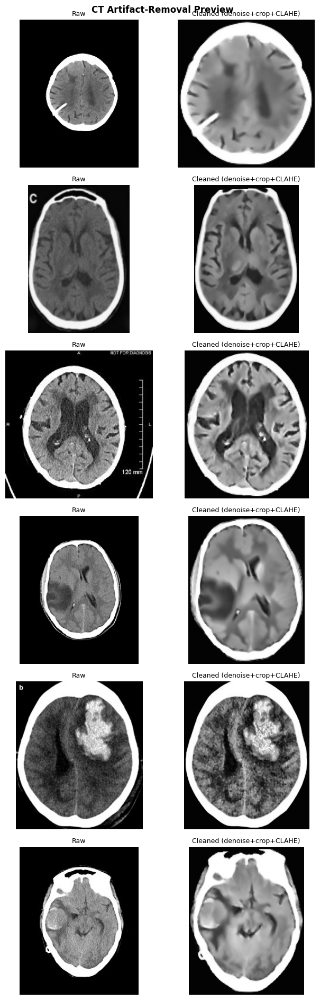

In [10]:
# ============================================================
# 5. Visual Sanity Check — before vs after cleaning
# ============================================================
def _sample_paths(n=3):
    paths = []
    for cls_dir in [HEALTHY_DIR, TUMOR_DIR]:
        files = sorted(glob(os.path.join(cls_dir, "*")))[:n]
        paths.extend(files)
    return paths

sample_paths = _sample_paths(3)

if sample_paths:
    fig, axes = plt.subplots(len(sample_paths), 2, figsize=(7, 3.2 * len(sample_paths)))
    if len(sample_paths) == 1:
        axes = axes.reshape(1, 2)
    for row, p in enumerate(sample_paths):
        try:
            raw = Image.open(p).convert("RGB")
            cleaned = clean_ct_image(raw)
            axes[row, 0].imshow(raw, cmap="gray")
            axes[row, 0].set_title("Raw", fontsize=9)
            axes[row, 0].axis("off")
            axes[row, 1].imshow(cleaned, cmap="gray")
            axes[row, 1].set_title("Cleaned (denoise+crop+CLAHE)", fontsize=9)
            axes[row, 1].axis("off")
        except Exception as e:
            print(f"Skipped preview for {p}: {e}")
    plt.suptitle("CT Artifact-Removal Preview", fontweight="bold")
    plt.tight_layout()
    plt.show()
else:
    print("No sample images found yet — check DATASET_ROOT / Healthy / Tumor paths.")


---
## PHASE 4 — Build Tensor Cache, Stratified Split & DataLoaders
> Images are copied from Drive to local Colab disk once (Drive/FUSE is slow to
> read repeatedly), cleaned with the Phase 3 pipeline, resized, and cached as
> a single uint8 tensor `.pt` file so future sessions load in seconds instead
> of re-processing every image again.


In [11]:
# ============================================================
# 1. Copy Drive folders to local disk (one-time per session)
# ============================================================
import shutil

def copy_dir_locally(drive_dir, local_dir):
    if os.path.exists(local_dir):
        print(f"Local copy already exists at {local_dir} — skipping copy.")
        return
    print(f"Copying {drive_dir}\n  -> {local_dir} ...")
    shutil.copytree(drive_dir, local_dir)
    print("Copy done.")

LOCAL_HEALTHY_DIR = os.path.join(LOCAL_RAW_DIR, "Healthy")
LOCAL_TUMOR_DIR   = os.path.join(LOCAL_RAW_DIR, "Tumor")

copy_dir_locally(HEALTHY_DIR, LOCAL_HEALTHY_DIR)
copy_dir_locally(TUMOR_DIR,   LOCAL_TUMOR_DIR)


Copying /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/Healthy
  -> /content/brain_tumor_ct_raw/Healthy ...
Copy done.
Copying /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/Tumor
  -> /content/brain_tumor_ct_raw/Tumor ...
Copy done.


In [12]:
# ============================================================
# 2. Build a single uint8 tensor cache from BOTH classes
# ============================================================
# Corrupt/unreadable files are skipped automatically (try/except below) —
# common in scraped CT datasets. Each image goes through the full Phase 3
# cleaning pipeline (denoise -> crop -> CLAHE) before resize, so cached
# tensors are already artifact-free.

import gc
from concurrent.futures import ThreadPoolExecutor

ALL_PT_PATH = os.path.join(LOCAL_PROCESSED_DIR, "ct_tensors.pt")

def build_ct_tensor_dataset(class_dirs, class_names, img_size=IMG_SIZE, max_workers=8):
    resize = T.Resize((img_size, img_size))

    class_to_idx = {c: i for i, c in enumerate(class_names)}
    image_paths, labels = [], []
    for cls, cls_dir in zip(class_names, class_dirs):
        for p in glob(os.path.join(cls_dir, "*")):
            image_paths.append(p)
            labels.append(class_to_idx[cls])

    n = len(image_paths)
    tensors    = torch.empty((n, 3, img_size, img_size), dtype=torch.uint8)
    out_labels = torch.empty(n, dtype=torch.long)
    kept_paths = [None] * n
    ok_mask    = torch.zeros(n, dtype=torch.bool)

    def _load_one(i):
        p, lbl = image_paths[i], labels[i]
        try:
            img = Image.open(p).convert("RGB")
            img = clean_ct_image(img)     # denoise + crop + CLAHE
            img = resize(img)
            arr = torch.from_numpy(np.array(img)).permute(2, 0, 1).contiguous()
            return i, arr, lbl, p
        except Exception as e:
            print(f"  Skipped (corrupt/unreadable): {p}  ({e})")
            return i, None, None, None

    with ThreadPoolExecutor(max_workers=max_workers) as ex:
        for i, arr, lbl, p in tqdm(ex.map(_load_one, range(n)), total=n,
                                    desc="  Cleaning + caching CT images"):
            if arr is not None:
                tensors[i]    = arr
                out_labels[i] = lbl
                kept_paths[i] = p
                ok_mask[i]    = True

    n_skipped = int((~ok_mask).sum())
    if n_skipped:
        print(f"Total skipped (corrupt/unreadable): {n_skipped} / {n}")

    if not ok_mask.all():
        tensors    = tensors[ok_mask]
        out_labels = out_labels[ok_mask]
        kept_paths = [p for p, ok in zip(kept_paths, ok_mask.tolist()) if ok]

    return {
        "tensors"     : tensors,
        "labels"      : out_labels,
        "paths"       : kept_paths,
        "class_names" : class_names,
        "class_to_idx": class_to_idx,
    }


if os.path.exists(ALL_PT_PATH):
    print("[FAST PATH] Tensor cache found — loading directly ...")
    all_raw = torch.load(ALL_PT_PATH, weights_only=False)
else:
    print("[FIRST RUN] Building tensor cache from cleaned CT images ...")
    all_raw = build_ct_tensor_dataset(
        class_dirs=[LOCAL_HEALTHY_DIR, LOCAL_TUMOR_DIR],
        class_names=CLASSES,
    )
    torch.save(all_raw, ALL_PT_PATH)
    print(f"Saved to {ALL_PT_PATH}")
    gc.collect()

print(f"\nTotal usable images : {len(all_raw['labels'])}")
print(f"Tensor shape        : {all_raw['tensors'].shape}  dtype={all_raw['tensors'].dtype}")


[FIRST RUN] Building tensor cache from cleaned CT images ...


  Cleaning + caching CT images: 100%|██████████| 4618/4618 [35:56<00:00,  2.14it/s]


Saved to /content/processed_dataset/ct_tensors.pt

Total usable images : 4618
Tensor shape        : torch.Size([4618, 3, 176, 176])  dtype=torch.uint8


In [13]:
# ============================================================
# 3. Stratified Train / Validation / Test Split (70 / 15 / 15)
# ============================================================
# There is no pre-made train/test split for this dataset (unlike the MRI
# version), so we create one here. Stratification keeps the Healthy/Tumor
# ratio consistent across all three sets — important since medical datasets
# are often class-imbalanced.

labels_np = all_raw["labels"].numpy()
idx_all   = np.arange(len(labels_np))

idx_train, idx_temp = train_test_split(
    idx_all, test_size=0.30, stratify=labels_np, random_state=SEED
)
idx_val, idx_test = train_test_split(
    idx_temp, test_size=0.50, stratify=labels_np[idx_temp], random_state=SEED
)

print(f"Train samples      : {len(idx_train)}")
print(f"Validation samples : {len(idx_val)}")
print(f"Test samples       : {len(idx_test)}")

def _dist(idx):
    vals, counts = np.unique(labels_np[idx], return_counts=True)
    return {CLASSES[v]: int(c) for v, c in zip(vals, counts)}

print("\nTrain distribution :", _dist(idx_train))
print("Val   distribution :", _dist(idx_val))
print("Test  distribution :", _dist(idx_test))


Train samples      : 3232
Validation samples : 693
Test samples       : 693

Train distribution : {'Healthy': 1610, 'Tumor': 1622}
Val   distribution : {'Healthy': 345, 'Tumor': 348}
Test  distribution : {'Healthy': 345, 'Tumor': 348}


In [14]:
# ============================================================
# 4. In-Memory Tensor Dataset Class
# ============================================================
# Tensors are stored as raw uint8 pixels; normalization (mean/std) happens
# HERE, per-sample, at read-time, so the full dataset is never held in RAM
# as float32 (4x smaller while cached).

class CTTensorDataset(torch.utils.data.Dataset):
    def __init__(self, data_dict, indices):
        self.tensors      = data_dict["tensors"]
        self.labels       = data_dict["labels"]
        self.paths        = data_dict["paths"]
        self.class_names  = data_dict["class_names"]
        self.class_to_idx = data_dict["class_to_idx"]
        self.indices      = indices
        self.mean = torch.tensor(MEAN).view(3, 1, 1)
        self.std  = torch.tensor(STD).view(3, 1, 1)

    def __len__(self):
        return len(self.indices)

    def __getitem__(self, i):
        idx   = self.indices[i]
        img   = self.tensors[idx].float() / 255.0
        img   = (img - self.mean) / self.std
        label = self.labels[idx].item()
        path  = self.paths[idx]
        return img, label, path


train_dataset = CTTensorDataset(all_raw, idx_train)
val_dataset   = CTTensorDataset(all_raw, idx_val)
test_dataset  = CTTensorDataset(all_raw, idx_test)

CLASS_NAMES  = all_raw["class_names"]
CLASS_TO_IDX = all_raw["class_to_idx"]
NUM_CLASSES  = len(CLASS_NAMES)

print(f"Train / Val / Test : {len(train_dataset)} / {len(val_dataset)} / {len(test_dataset)}")
print(f"Classes            : {CLASS_NAMES}")


Train / Val / Test : 3232 / 693 / 693
Classes            : ['Healthy', 'Tumor']


In [15]:
# ============================================================
# 5. DataLoaders + Per-Sample Augmentation (anti-leakage)
# ============================================================
# Augmentation is applied PER-SAMPLE (a unique random flip/rotation/
# translation/zoom for every image, every epoch) instead of one shared
# transform per batch — this prevents the model from keying off a fixed
# corner/border position shared across a batch.
#
# Rotation/translation exposes corners that need a fill color. Since this
# runs AFTER normalization, filling with 0 would NOT be black (it maps to
# the mean pixel value) — so we fill with the normalized equivalent of
# true black instead.

import torchvision.transforms.functional as TF

FILL_VALUE = [(-m / s) for m, s in zip(MEAN, STD)]

def batch_augment(batch):
    imgs, labels, paths = zip(*batch)
    imgs   = torch.stack(imgs)
    labels = torch.tensor(labels, dtype=torch.long)

    B, C, H, W = imgs.shape
    out = torch.empty_like(imgs)

    for i in range(B):
        img = imgs[i]
        if torch.rand(1).item() > 0.5:
            img = TF.hflip(img)

        angle = (torch.rand(1).item() * 30) - 15
        tx    = (torch.rand(1).item() * 0.10 - 0.05) * W
        ty    = (torch.rand(1).item() * 0.10 - 0.05) * H
        scale = 1.0 + (torch.rand(1).item() * 0.20 - 0.10)

        img = TF.affine(
            img, angle=angle, translate=[int(tx), int(ty)],
            scale=scale, shear=[0.0, 0.0], fill=FILL_VALUE
        )
        out[i] = img

    return out, labels, list(paths)


def standard_collate(batch):
    imgs, labels, paths = zip(*batch)
    return torch.stack(imgs), torch.tensor(labels, dtype=torch.long), list(paths)


train_loader = DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True,
    num_workers=0, collate_fn=batch_augment, drop_last=True,
)
val_loader = DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=0, collate_fn=standard_collate,
)
test_loader = DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False,
    num_workers=0, collate_fn=standard_collate,
)

print(f"Train batches : {len(train_loader)}")
print(f"Val batches   : {len(val_loader)}")
print(f"Test batches  : {len(test_loader)}")

t0 = time.time()
imgs, lbls, _ = next(iter(train_loader))
print(f"First batch shape : {imgs.shape}  ({time.time()-t0:.3f}s)")
print("PHASE 4 COMPLETED — DataLoaders ready")


Train batches : 101
Val batches   : 22
Test batches  : 22
First batch shape : torch.Size([32, 3, 176, 176])  (0.175s)
PHASE 4 COMPLETED — DataLoaders ready


---
## PHASE 5 — Data Visualization

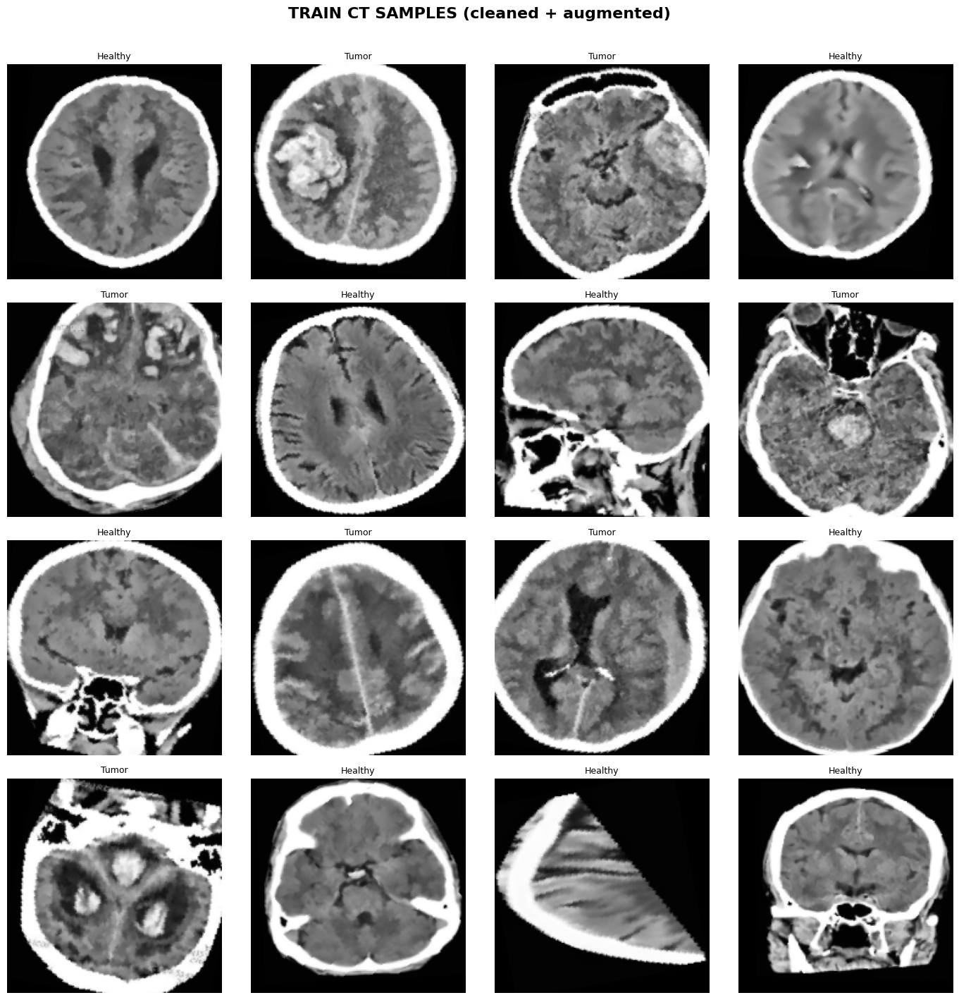

In [16]:
# ============================================================
# Denormalization Helper
# ============================================================
def denormalize(tensor, mean=MEAN, std=STD):
    img = tensor.clone().detach().cpu().numpy()
    for c in range(3):
        img[c] = img[c] * std[c] + mean[c]
    img = np.transpose(img, (1, 2, 0))
    return np.clip(img, 0, 1)

def visualize_samples(loader, class_names, title, rows=4, cols=4):
    images, labels, _ = next(iter(loader))
    plt.figure(figsize=(14, 14))
    plt.suptitle(title, fontsize=16, fontweight='bold', y=1.01)
    n = min(rows * cols, len(images))
    for i in range(n):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(denormalize(images[i]), cmap="gray")
        plt.title(class_names[labels[i]], fontsize=9)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

visualize_samples(train_loader, CLASS_NAMES, "TRAIN CT SAMPLES (cleaned + augmented)")


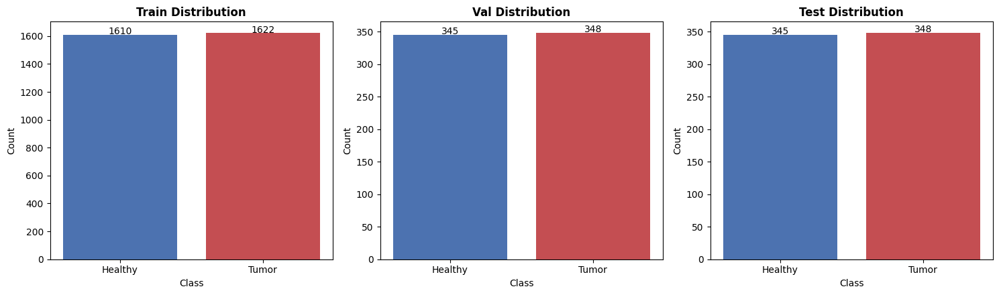

PHASE 5 COMPLETED


In [17]:
# ============================================================
# Dataset Distribution Bar Chart
# ============================================================
def get_distribution(indices):
    counts = {c: 0 for c in CLASSES}
    for idx in indices:
        counts[CLASSES[labels_np[idx]]] += 1
    return counts

train_counts = get_distribution(idx_train)
val_counts   = get_distribution(idx_val)
test_counts  = get_distribution(idx_test)

fig, axes = plt.subplots(1, 3, figsize=(15, 4.5))
for ax, counts, title in zip(axes,
                              [train_counts, val_counts, test_counts],
                              ["Train Distribution", "Val Distribution", "Test Distribution"]):
    bars = ax.bar(counts.keys(), counts.values(), color=['#4C72B0', '#C44E52'])
    ax.set_title(title, fontweight='bold')
    ax.set_xlabel("Class")
    ax.set_ylabel("Count")
    for bar in bars:
        ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
                str(int(bar.get_height())), ha='center', fontsize=10)

plt.tight_layout()
plt.show()
print("PHASE 5 COMPLETED")


---
## PHASE 6 — Shared Training & Evaluation Engine
> These functions are used by every model below. Run once.

In [18]:
# ============================================================
# Shared Training Engine
# ============================================================
import sys, shutil, os as _os
import torch.amp
import threading

def train_model(model, model_name, train_loader, val_loader,
                criterion, optimizer, scheduler=None, epochs=EPOCHS):

    local_path = f"/content/{model_name}_best.pth"
    drive_dir  = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models"
    _os.makedirs(drive_dir, exist_ok=True)
    drive_path = f"{drive_dir}/{model_name}_best.pth"

    scaler = torch.amp.GradScaler('cuda')

    best_val_acc = 0.0
    train_losses, val_losses         = [], []
    train_accuracies, val_accuracies = [], []

    print(f"\n{'='*60}")
    print(f" TRAINING: {model_name}")
    print(f"{'='*60}")
    sys.stdout.flush()

    start_time = time.time()

    for epoch in range(epochs):
        # ── TRAIN ────────────────────────────────────────────
        model.train()
        running_loss, correct, total = 0.0, 0, 0

        for batch_idx, (images, labels, _) in enumerate(train_loader):
            images = images.to(device, non_blocking=True)
            labels = labels.to(device, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            with torch.amp.autocast('cuda'):
                outputs = model(images)

                # InceptionV3 returns a named tuple (logits, aux_logits) in train mode
                if isinstance(outputs, tuple):
                    logits, aux_logits_out = outputs[0], outputs[1]
                    loss = criterion(logits, labels)
                    if aux_logits_out is not None:
                        loss += 0.4 * criterion(aux_logits_out, labels)
                    outputs = logits
                else:
                    loss = criterion(outputs, labels)

            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            scaler.step(optimizer)
            scaler.update()

            running_loss += loss.item()
            _, predicted  = torch.max(outputs, 1)
            total        += labels.size(0)
            correct      += (predicted == labels).sum().item()

            if (batch_idx + 1) % 20 == 0:
                print(f"  Epoch {epoch+1}/{epochs} | Batch {batch_idx+1}/{len(train_loader)} | "
                      f"Loss: {running_loss/(batch_idx+1):.4f}", end='\r')
                sys.stdout.flush()

        train_loss = running_loss / len(train_loader)
        train_acc  = 100 * correct / total
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)

        # ── VALIDATE ─────────────────────────────────────────
        model.eval()
        val_loss_sum, correct, total = 0.0, 0, 0
        with torch.no_grad():
            for images, labels, _ in val_loader:
                images = images.to(device, non_blocking=True)
                labels = labels.to(device, non_blocking=True)
                with torch.amp.autocast('cuda'):
                    outputs = model(images)
                    if isinstance(outputs, tuple):
                        outputs = outputs[0]
                    loss = criterion(outputs, labels)
                val_loss_sum += loss.item()
                _, predicted  = torch.max(outputs, 1)
                total        += labels.size(0)
                correct      += (predicted == labels).sum().item()

        val_loss = val_loss_sum / len(val_loader)
        val_acc  = 100 * correct / total
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)

        if scheduler:
            if isinstance(scheduler, optim.lr_scheduler.ReduceLROnPlateau):
                scheduler.step(val_loss)
            else:
                scheduler.step()

        # ── SAVE BEST → local + Drive (non-blocking) ─────────
        saved = ""
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), local_path)
            def _copy():
                try:
                    shutil.copy2(local_path, drive_path)
                except Exception:
                    pass
            threading.Thread(target=_copy, daemon=True).start()
            saved = "  <- Best Saved (local + Drive)"

        print(f"Epoch [{epoch+1:02d}/{epochs}]  "
              f"Train Loss: {train_loss:.4f}  Train Acc: {train_acc:.2f}%  "
              f"Val Loss: {val_loss:.4f}  Val Acc: {val_acc:.2f}%{saved}")
        sys.stdout.flush()

    elapsed = time.time() - start_time
    print(f"\nTraining Time : {elapsed/60:.1f} min")
    print(f"Best Val Acc  : {best_val_acc:.2f}%")
    print(f"Saved locally : {local_path}")
    print(f"Saved to Drive: {drive_path}")
    sys.stdout.flush()

    return {
        "train_losses"    : train_losses,
        "val_losses"      : val_losses,
        "train_accuracies": train_accuracies,
        "val_accuracies"  : val_accuracies,
        "best_val_acc"    : best_val_acc,
        "save_path"       : local_path,
        "drive_path"      : drive_path,
        "training_time"   : elapsed
    }


In [19]:
# ============================================================
# Evaluation Function (Test Set) — includes sensitivity/specificity,
# which matter more than raw accuracy for a Healthy-vs-Tumor screening task
# ============================================================
def evaluate_model(model, test_loader, class_names, model_name):

    model.eval()
    all_preds, all_labels, all_probs = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            probs   = torch.softmax(outputs, dim=1)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probs.extend(probs.cpu().numpy())

    all_preds  = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs  = np.array(all_probs)

    accuracy = 100 * np.sum(all_preds == all_labels) / len(all_labels)

    tumor_idx = class_names.index("Tumor")
    tp = np.sum((all_preds == tumor_idx) & (all_labels == tumor_idx))
    fn = np.sum((all_preds != tumor_idx) & (all_labels == tumor_idx))
    tn = np.sum((all_preds != tumor_idx) & (all_labels != tumor_idx))
    fp = np.sum((all_preds == tumor_idx) & (all_labels != tumor_idx))

    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0.0   # recall on Tumor
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0   # recall on Healthy

    print(f"\n{'='*60}")
    print(f" TEST EVALUATION: {model_name}")
    print(f"{'='*60}")
    print(f"\nTest Accuracy : {accuracy:.2f}%")
    print(f"Sensitivity (Tumor recall)   : {sensitivity*100:.2f}%")
    print(f"Specificity (Healthy recall) : {specificity*100:.2f}%")
    print("\nClassification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    return {
        "accuracy"    : accuracy,
        "sensitivity" : sensitivity,
        "specificity" : specificity,
        "preds"       : all_preds,
        "labels"      : all_labels,
        "probs"       : all_probs
    }


In [20]:
# ============================================================
# Cross-Session Result Storage (Google Drive)
# ============================================================
import json

RESULTS_DIR = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results"
os.makedirs(RESULTS_DIR, exist_ok=True)

def save_model_result(model_name, eval_dict, history_dict, mean_auc):
    result = {
        "Model": model_name,
        "Test Accuracy (%)": float(eval_dict["accuracy"]),
        "Sensitivity (%)": float(eval_dict["sensitivity"] * 100),
        "Specificity (%)": float(eval_dict["specificity"] * 100),
        "Mean AUC": float(mean_auc),
        "Training Time (min)": float(history_dict["training_time"]) / 60,
        "Best Val Acc (%)": float(history_dict["best_val_acc"]),
    }
    path = f"{RESULTS_DIR}/{model_name.replace(' ', '_').replace('-', '_')}_result.json"
    with open(path, "w") as f:
        json.dump(result, f, indent=2)
    print(f"Saved -> {path}")

def load_all_model_results():
    rows = []
    for fname in sorted(os.listdir(RESULTS_DIR)):
        if fname.endswith("_result.json"):
            with open(os.path.join(RESULTS_DIR, fname)) as f:
                rows.append(json.load(f))
    if not rows:
        raise FileNotFoundError(
            f"No result files found in {RESULTS_DIR}. "
            "Evaluate at least one model first (this calls save_model_result())."
        )
    return pd.DataFrame(rows)


In [21]:
# ============================================================
# Plot Training Curves
# ============================================================
def plot_training_curves(history, model_name):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(f"{model_name} — Training Curves", fontsize=14, fontweight='bold')

    axes[0].plot(history["train_losses"], label="Train Loss", color='#4C72B0')
    axes[0].plot(history["val_losses"],   label="Val Loss",   color='#DD8452')
    axes[0].set_title("Loss"); axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Loss")
    axes[0].legend(); axes[0].grid(True, alpha=0.3)

    axes[1].plot(history["train_accuracies"], label="Train Accuracy", color='#55A868')
    axes[1].plot(history["val_accuracies"],   label="Val Accuracy",   color='#C44E52')
    axes[1].set_title("Accuracy (%)"); axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("Accuracy (%)")
    axes[1].legend(); axes[1].grid(True, alpha=0.3)

    plt.tight_layout()
    plt.show()


In [22]:
# ============================================================
# Plot Confusion Matrix
# ============================================================
def plot_confusion_matrix(eval_results, class_names, model_name):
    cm = confusion_matrix(eval_results["labels"], eval_results["preds"])
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"{model_name} — Confusion Matrix", fontweight='bold')
    plt.xlabel("Predicted"); plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()


In [23]:
# ============================================================
# Plot ROC Curve (binary)
# ============================================================
def plot_roc_curves(eval_results, class_names, model_name):
    labels = eval_results["labels"]
    probs  = eval_results["probs"]
    tumor_idx = class_names.index("Tumor")

    binary_labels = (labels == tumor_idx).astype(int)
    fpr, tpr, _ = roc_curve(binary_labels, probs[:, tumor_idx])
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f"Tumor vs Healthy  (AUC = {roc_auc:.4f})", color='#C44E52')
    plt.plot([0, 1], [0, 1], 'k--', lw=1)
    plt.title(f"{model_name} — ROC Curve", fontweight='bold')
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right'); plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

    print(f"AUC: {roc_auc:.4f}")
    return roc_auc, [roc_auc]


In [24]:
# ============================================================
# Confidence Distribution Plot
# ============================================================
def plot_confidence_distribution(eval_results, class_names, model_name):
    probs  = eval_results["probs"]
    preds  = eval_results["preds"]
    labels = eval_results["labels"]

    max_conf = np.max(probs, axis=1)
    correct  = (preds == labels)

    plt.figure(figsize=(9, 5))
    plt.hist(max_conf[correct],  bins=30, alpha=0.7, label="Correct",   color='#55A868')
    plt.hist(max_conf[~correct], bins=30, alpha=0.7, label="Incorrect", color='#C44E52')
    plt.title(f"{model_name} — Confidence Distribution", fontweight='bold')
    plt.xlabel("Max Confidence Score"); plt.ylabel("Count")
    plt.legend(); plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


In [25]:
# ============================================================
# Error Analysis — Show Misclassified Samples
# ============================================================
def plot_error_analysis(model, test_loader, class_names, model_name, n_samples=8):
    model.eval()
    wrong_images, wrong_preds, wrong_labels = [], [], []

    with torch.no_grad():
        for images, labels, _ in test_loader:
            images_gpu, labels_gpu = images.to(device), labels.to(device)
            outputs  = model(images_gpu)
            _, preds = torch.max(outputs, 1)

            mask = (preds != labels_gpu)
            for i in range(len(mask)):
                if mask[i]:
                    wrong_images.append(images[i])
                    wrong_preds.append(preds[i].item())
                    wrong_labels.append(labels[i].item())
                if len(wrong_images) >= n_samples:
                    break
            if len(wrong_images) >= n_samples:
                break

    if not wrong_images:
        print("No misclassified samples found!")
        return

    cols = 4
    rows = (len(wrong_images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 3.5))
    fig.suptitle(f"{model_name} — Misclassified Samples", fontsize=13, fontweight='bold')
    axes = axes.flatten() if rows > 1 else [axes] if cols == 1 else axes

    for i in range(len(wrong_images)):
        img = denormalize(wrong_images[i])
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(
            f"True: {class_names[wrong_labels[i]]}\nPred: {class_names[wrong_preds[i]]}",
            fontsize=8, color='red'
        )
        axes[i].axis("off")

    for j in range(len(wrong_images), len(axes)):
        axes[j].axis("off")

    plt.tight_layout()
    plt.show()
    print(f"Total misclassified shown: {len(wrong_images)}")


In [26]:
# ============================================================
# Grad-CAM Visualization Function
# ============================================================
def run_gradcam(model, model_name, target_layer, test_loader,
                class_names, n_samples=8, reshape_transform=None):
    original_requires_grad_states = {}
    for name, param in model.named_parameters():
        original_requires_grad_states[name] = param.requires_grad
        param.requires_grad = True

    model.eval()

    if reshape_transform is not None:
        cam = GradCAM(model=model, target_layers=[target_layer],
                      reshape_transform=reshape_transform)
    else:
        cam = GradCAM(model=model, target_layers=[target_layer])

    sample_images, sample_labels = [], []
    collected = 0
    for images, labels, _ in test_loader:
        for i in range(len(images)):
            sample_images.append(images[i])
            sample_labels.append(labels[i].item())
            collected += 1
            if collected >= n_samples:
                break
        if collected >= n_samples:
            break

    cols = 4
    rows = (n_samples + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols * 2, figsize=(cols * 5, rows * 4))
    fig.suptitle(f"{model_name} — Grad-CAM Heatmaps", fontsize=14, fontweight='bold')

    for i in range(n_samples):
        img_tensor = sample_images[i].unsqueeze(0).to(device)
        true_label = sample_labels[i]

        with torch.no_grad():
            output = model(img_tensor)
            pred_label = torch.argmax(output, dim=1).item()

        targets = [ClassifierOutputTarget(pred_label)]
        grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]

        rgb_img = np.ascontiguousarray(denormalize(sample_images[i]).astype(np.float32))
        cam_image = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        row = i // cols
        col = (i % cols) * 2

        axes[row, col].imshow(rgb_img, cmap='gray')
        axes[row, col].set_title(
            f"True: {class_names[true_label]}\nPred: {class_names[pred_label]}",
            fontsize=8, color='green' if true_label == pred_label else 'red'
        )
        axes[row, col].axis('off')

        axes[row, col + 1].imshow(cam_image)
        axes[row, col + 1].set_title("Grad-CAM", fontsize=8)
        axes[row, col + 1].axis('off')

    total_axes = rows * cols * 2
    for j in range(n_samples * 2, total_axes):
        r, c = divmod(j, cols * 2)
        axes[r, c].axis('off')

    plt.tight_layout()
    plt.show()
    print(f"Grad-CAM complete for {model_name}")

    for name, param in model.named_parameters():
        param.requires_grad = original_requires_grad_states[name]


---
## PHASE 7 — Model 1: VGG16

In [27]:
# ============================================================
# VGG16 — Build Model
# ============================================================
MODEL_NAME = "VGG16"

vgg16 = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)

# Freeze early layers, unfreeze last 2 conv blocks (features[24:])
for param in vgg16.features.parameters():
    param.requires_grad = False
for param in vgg16.features[24:].parameters():
    param.requires_grad = True

# Improved classifier head
vgg16.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg16 = vgg16.to(device)
trainable = sum(p.numel() for p in vgg16.parameters() if p.requires_grad)
print(f"VGG16 trainable params: {trainable:,}")

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:03<00:00, 180MB/s]


VGG16 trainable params: 128,723,970


In [28]:
# ============================================================
# VGG16 — Train
# ============================================================
criterion_vgg16 = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg16 = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg16.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg16 = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg16, T_max=EPOCHS, eta_min=1e-6
)

history_vgg16 = train_model(
    model=vgg16, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg16, optimizer=optimizer_vgg16,
    scheduler=scheduler_vgg16, epochs=EPOCHS
)


 TRAINING: VGG16
Epoch [01/20]  Train Loss: 0.4851  Train Acc: 81.65%  Val Loss: 0.4581  Val Acc: 81.39%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.3917  Train Acc: 89.42%  Val Loss: 0.3257  Val Acc: 91.92%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3615  Train Acc: 91.71%  Val Loss: 0.3378  Val Acc: 91.05%
Epoch [04/20]  Train Loss: 0.3376  Train Acc: 93.16%  Val Loss: 0.3073  Val Acc: 93.07%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3022  Train Acc: 95.02%  Val Loss: 0.3046  Val Acc: 94.81%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.2980  Train Acc: 95.27%  Val Loss: 0.3050  Val Acc: 94.37%
Epoch [07/20]  Train Loss: 0.2870  Train Acc: 95.85%  Val Loss: 0.2885  Val Acc: 95.67%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.2643  Train Acc: 97.00%  Val Loss: 0.2834  Val Acc: 95.96%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.2608  Train Acc: 97.15%  Val Loss: 0.2960  Val Acc: 95.82%
Epoc


 TEST EVALUATION: VGG16

Test Accuracy : 96.10%
Sensitivity (Tumor recall)   : 94.83%
Specificity (Healthy recall) : 97.39%

Classification Report:

              precision    recall  f1-score   support

     Healthy       0.95      0.97      0.96       345
       Tumor       0.97      0.95      0.96       348

    accuracy                           0.96       693
   macro avg       0.96      0.96      0.96       693
weighted avg       0.96      0.96      0.96       693



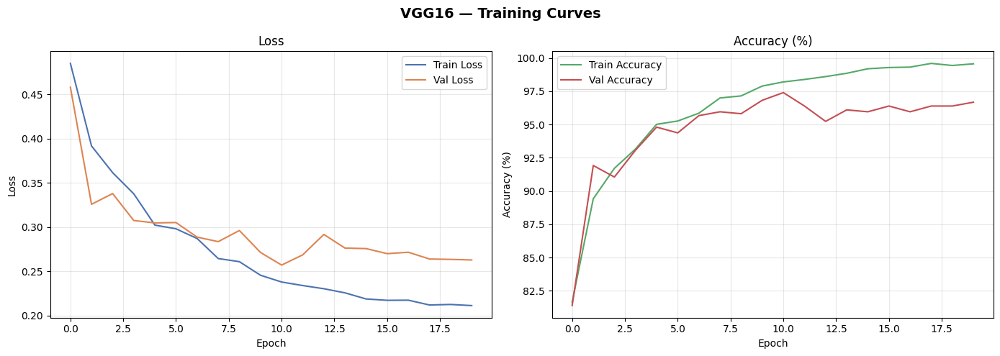

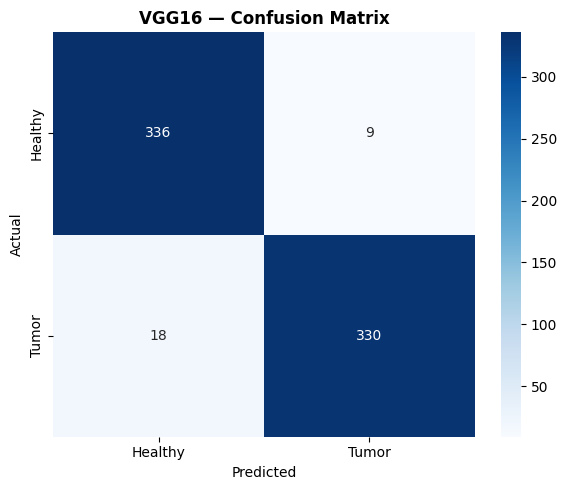

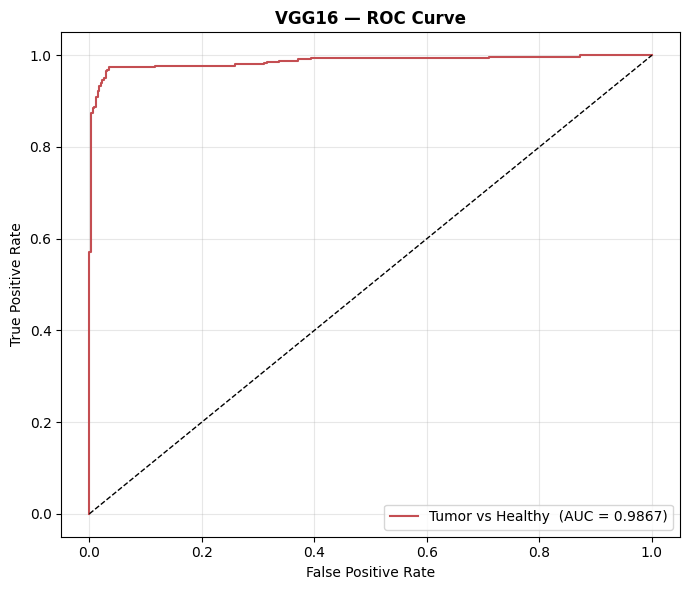

AUC: 0.9867


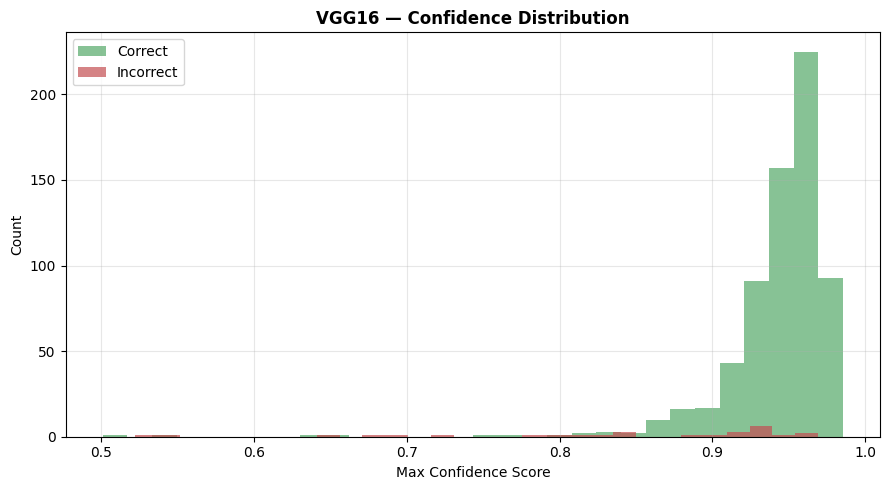

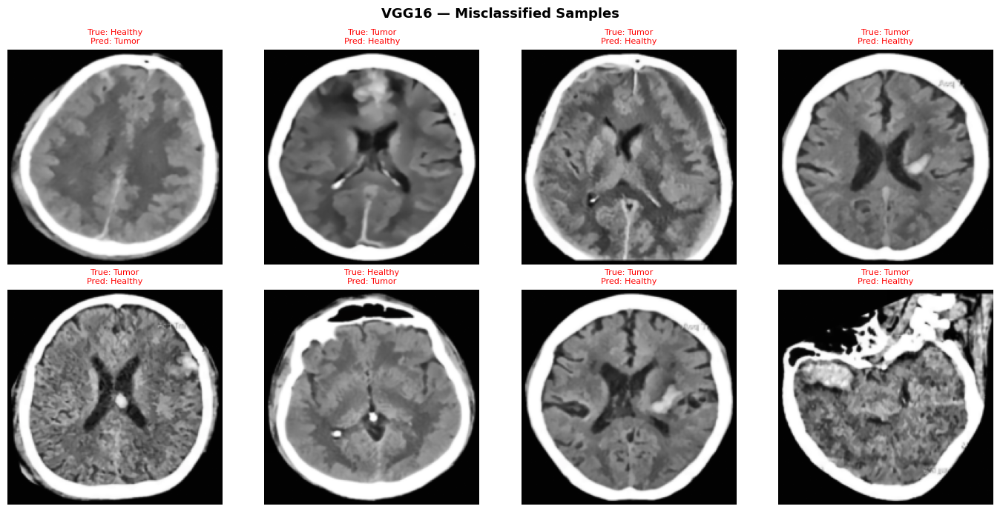

Total misclassified shown: 8


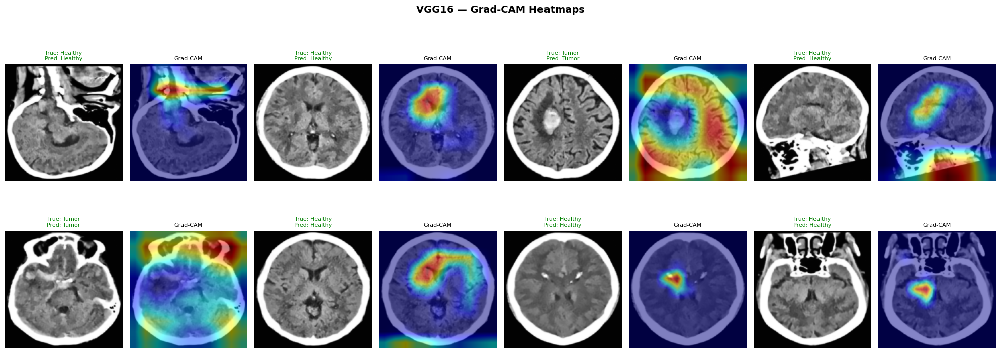

Grad-CAM complete for VGG16


In [29]:
# ============================================================
# VGG16 — Evaluate + Grad-CAM
# ============================================================
vgg16.load_state_dict(torch.load(history_vgg16["save_path"], map_location=device))

eval_vgg16 = evaluate_model(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg16, MODEL_NAME)
plot_confusion_matrix(eval_vgg16, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg16, _ = plot_roc_curves(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg16, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg16, test_loader, CLASS_NAMES, MODEL_NAME)

# Grad-CAM target: last conv block in VGG16 features
run_gradcam(
    model=vgg16, model_name=MODEL_NAME,
    target_layer=vgg16.features[-3],
    test_loader=test_loader, class_names=CLASS_NAMES, n_samples=8
)

In [30]:
save_model_result("VGG16", eval_vgg16, history_vgg16, mean_auc_vgg16)

Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results/VGG16_result.json


---
## PHASE 8 — Model 2: VGG19

In [31]:
# ============================================================
# VGG19 — Build Model
# ============================================================
MODEL_NAME = "VGG19"

vgg19 = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)

for param in vgg19.features.parameters():
    param.requires_grad = False
for param in vgg19.features[28:].parameters():   # unfreeze last 2 blocks
    param.requires_grad = True

vgg19.classifier[6] = nn.Sequential(
    nn.Linear(4096, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

vgg19 = vgg19.to(device)
trainable = sum(p.numel() for p in vgg19.parameters() if p.requires_grad)
print(f"VGG19 trainable params: {trainable:,}")

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:04<00:00, 118MB/s]


VGG19 trainable params: 131,083,778


In [32]:
# ============================================================
# VGG19 — Train
# ============================================================
criterion_vgg19 = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vgg19 = optim.AdamW(
    filter(lambda p: p.requires_grad, vgg19.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_vgg19 = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vgg19, T_max=EPOCHS, eta_min=1e-6
)

history_vgg19 = train_model(
    model=vgg19, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_vgg19, optimizer=optimizer_vgg19,
    scheduler=scheduler_vgg19, epochs=EPOCHS
)


 TRAINING: VGG19
Epoch [01/20]  Train Loss: 0.4962  Train Acc: 81.87%  Val Loss: 0.4183  Val Acc: 87.30%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.3877  Train Acc: 90.19%  Val Loss: 0.3616  Val Acc: 92.78%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3723  Train Acc: 91.03%  Val Loss: 0.3561  Val Acc: 91.34%
Epoch [04/20]  Train Loss: 0.3230  Train Acc: 93.72%  Val Loss: 0.3045  Val Acc: 93.94%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.3105  Train Acc: 94.37%  Val Loss: 0.3202  Val Acc: 94.66%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.3028  Train Acc: 94.80%  Val Loss: 0.3042  Val Acc: 93.94%
Epoch [07/20]  Train Loss: 0.2945  Train Acc: 95.11%  Val Loss: 0.3562  Val Acc: 92.06%
Epoch [08/20]  Train Loss: 0.2743  Train Acc: 95.92%  Val Loss: 0.3029  Val Acc: 94.81%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.2725  Train Acc: 96.41%  Val Loss: 0.2859  Val Acc: 95.67%  <- Best Saved (local + Drive)
Epoc


 TEST EVALUATION: VGG19

Test Accuracy : 96.54%
Sensitivity (Tumor recall)   : 95.11%
Specificity (Healthy recall) : 97.97%

Classification Report:

              precision    recall  f1-score   support

     Healthy       0.95      0.98      0.97       345
       Tumor       0.98      0.95      0.97       348

    accuracy                           0.97       693
   macro avg       0.97      0.97      0.97       693
weighted avg       0.97      0.97      0.97       693



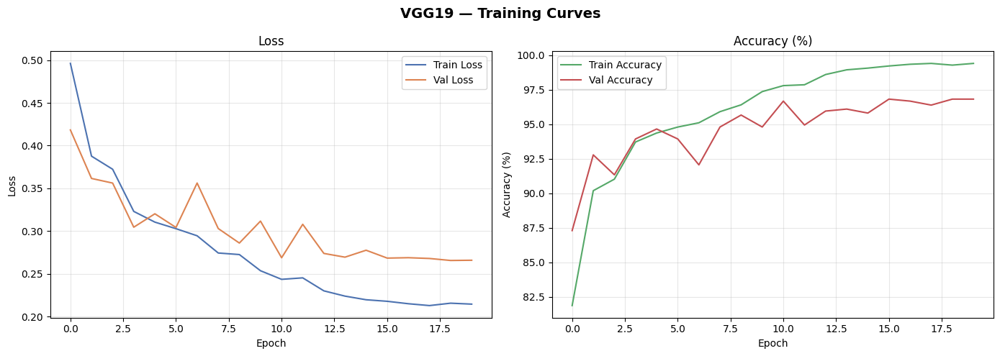

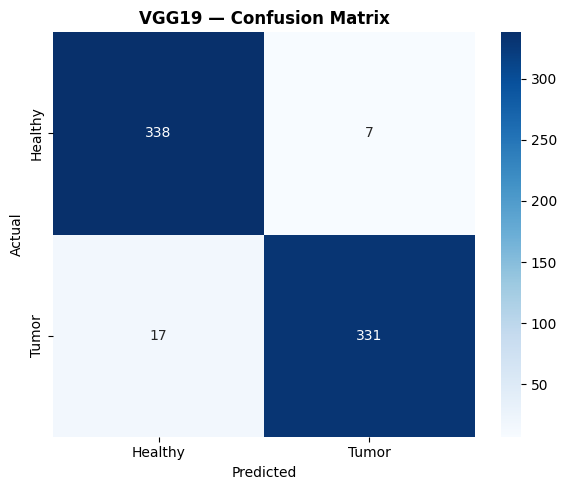

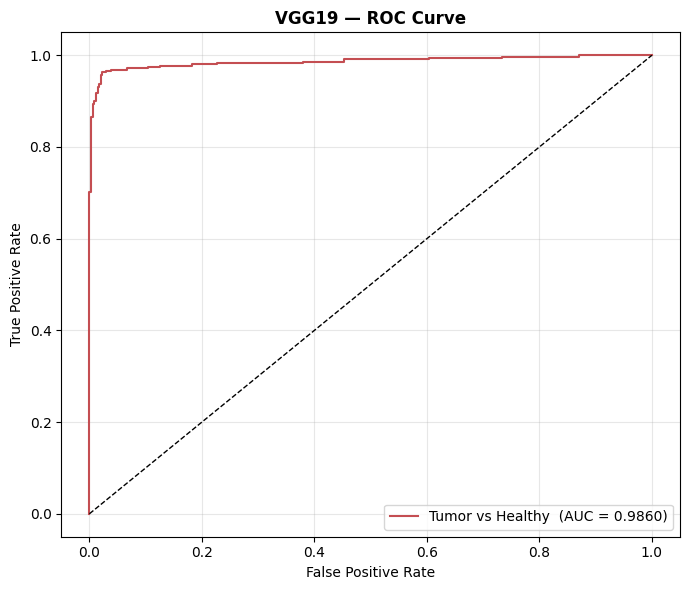

AUC: 0.9860


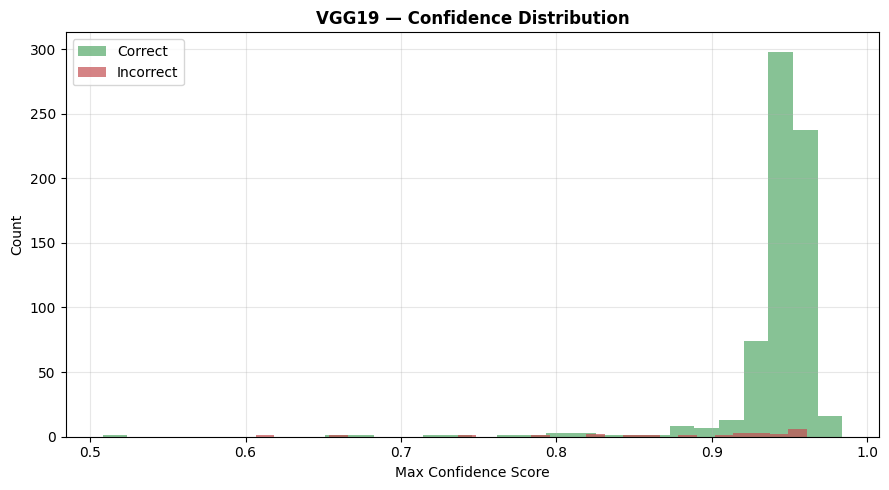

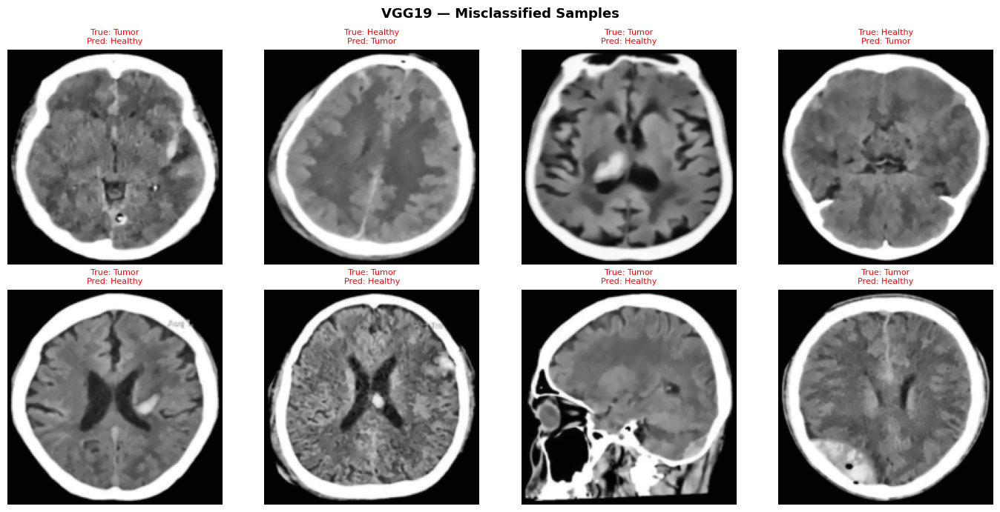

Total misclassified shown: 8


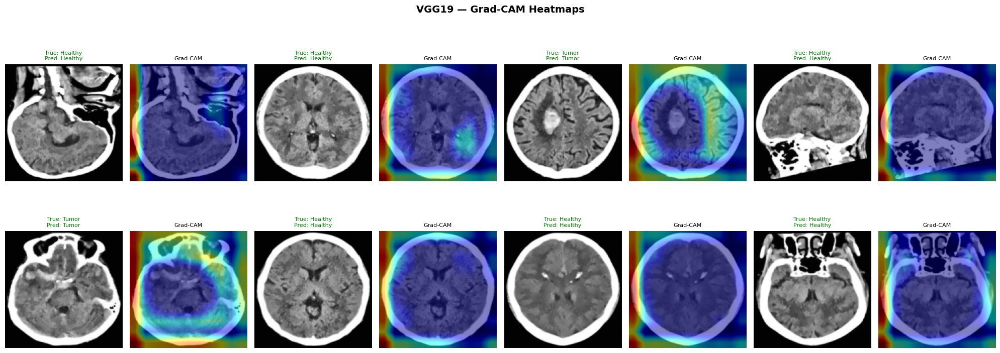

Grad-CAM complete for VGG19


In [33]:
# ============================================================
# VGG19 — Evaluate + Grad-CAM
# ============================================================
vgg19.load_state_dict(torch.load(history_vgg19["save_path"], map_location=device))

eval_vgg19 = evaluate_model(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vgg19, MODEL_NAME)
plot_confusion_matrix(eval_vgg19, CLASS_NAMES, MODEL_NAME)
mean_auc_vgg19, _ = plot_roc_curves(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vgg19, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vgg19, test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(vgg19, MODEL_NAME, vgg19.features[-3], test_loader, CLASS_NAMES)

In [35]:
save_model_result("VGG19", eval_vgg19, history_vgg19, mean_auc_vgg19)

Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results/VGG19_result.json


---
## PHASE 9 — Model 3: DenseNet121

In [34]:
# ============================================================
# DenseNet121 — Build Model
# ============================================================
MODEL_NAME = "DenseNet121"

densenet = models.densenet121(weights=models.DenseNet121_Weights.IMAGENET1K_V1)

# Freeze early, unfreeze denseblock3, denseblock4, norm5
for param in densenet.features.parameters():
    param.requires_grad = False
for param in densenet.features.denseblock3.parameters():
    param.requires_grad = True
for param in densenet.features.denseblock4.parameters():
    param.requires_grad = True
for param in densenet.features.norm5.parameters():
    param.requires_grad = True

densenet.classifier = nn.Sequential(
    nn.Linear(densenet.classifier.in_features, 256),
    nn.ReLU(inplace=True),
    nn.Dropout(0.4),
    nn.Linear(256, NUM_CLASSES)
)

densenet = densenet.to(device)
trainable = sum(p.numel() for p in densenet.parameters() if p.requires_grad)
print(f"DenseNet121 trainable params: {trainable:,}")

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


100%|██████████| 30.8M/30.8M [00:00<00:00, 207MB/s]


DenseNet121 trainable params: 5,260,802


In [36]:
# ============================================================
# DenseNet121 — Train
# ============================================================
criterion_densenet = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_densenet = optim.AdamW(
    filter(lambda p: p.requires_grad, densenet.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_densenet = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_densenet, T_max=EPOCHS, eta_min=1e-6
)

history_densenet = train_model(
    model=densenet, model_name=MODEL_NAME,
    train_loader=train_loader, val_loader=val_loader,
    criterion=criterion_densenet, optimizer=optimizer_densenet,
    scheduler=scheduler_densenet, epochs=EPOCHS
)


 TRAINING: DenseNet121
Epoch [01/20]  Train Loss: 0.4090  Train Acc: 86.73%  Val Loss: 0.3026  Val Acc: 95.24%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.3096  Train Acc: 94.03%  Val Loss: 0.2793  Val Acc: 96.25%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.2785  Train Acc: 95.79%  Val Loss: 0.2568  Val Acc: 95.96%
Epoch [04/20]  Train Loss: 0.2671  Train Acc: 96.60%  Val Loss: 0.2602  Val Acc: 96.68%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.2545  Train Acc: 96.91%  Val Loss: 0.2530  Val Acc: 97.26%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.2434  Train Acc: 97.65%  Val Loss: 0.2472  Val Acc: 97.26%
Epoch [07/20]  Train Loss: 0.2320  Train Acc: 98.33%  Val Loss: 0.2510  Val Acc: 97.26%
Epoch [08/20]  Train Loss: 0.2274  Train Acc: 98.67%  Val Loss: 0.2495  Val Acc: 96.83%
Epoch [09/20]  Train Loss: 0.2229  Train Acc: 98.98%  Val Loss: 0.2480  Val Acc: 97.40%  <- Best Saved (local + Drive)
Epoch [10/20]  Train Loss: 0.


 TEST EVALUATION: DenseNet121

Test Accuracy : 98.85%
Sensitivity (Tumor recall)   : 98.28%
Specificity (Healthy recall) : 99.42%

Classification Report:

              precision    recall  f1-score   support

     Healthy       0.98      0.99      0.99       345
       Tumor       0.99      0.98      0.99       348

    accuracy                           0.99       693
   macro avg       0.99      0.99      0.99       693
weighted avg       0.99      0.99      0.99       693



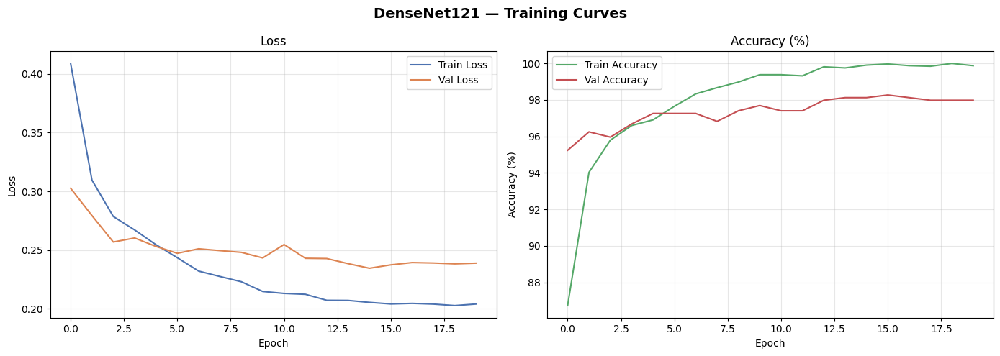

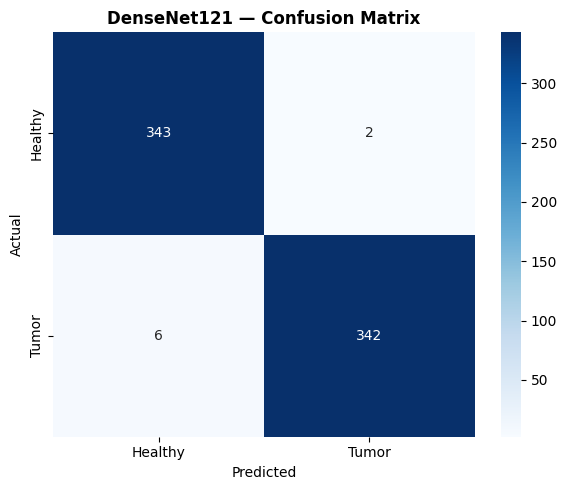

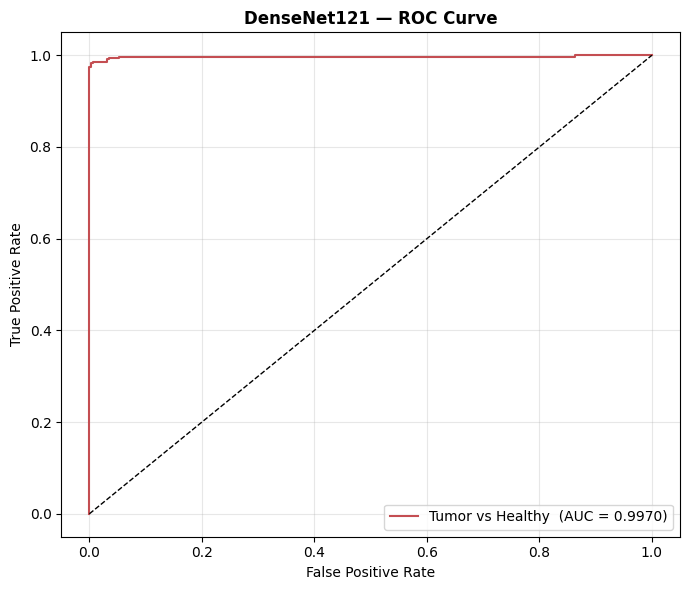

AUC: 0.9970


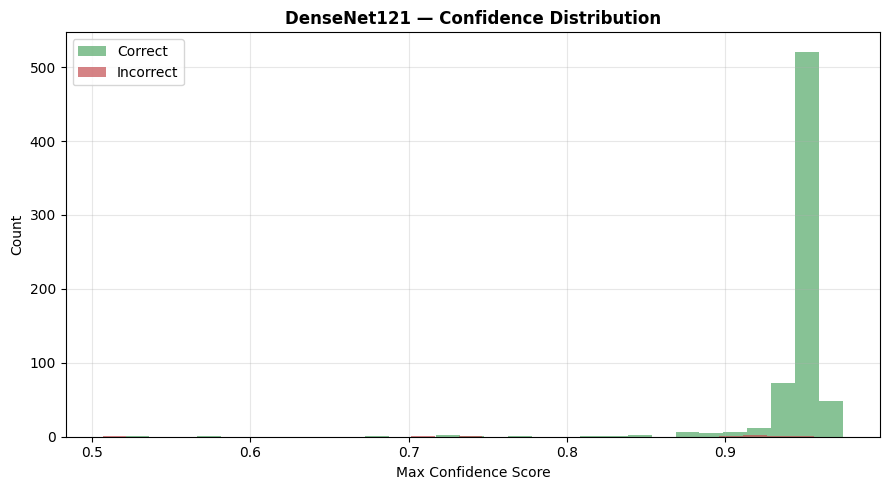

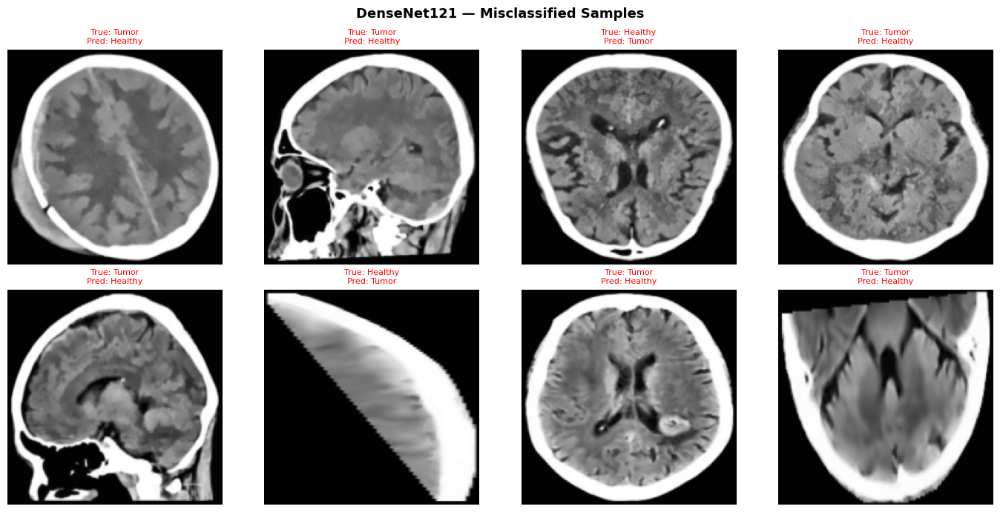

Total misclassified shown: 8


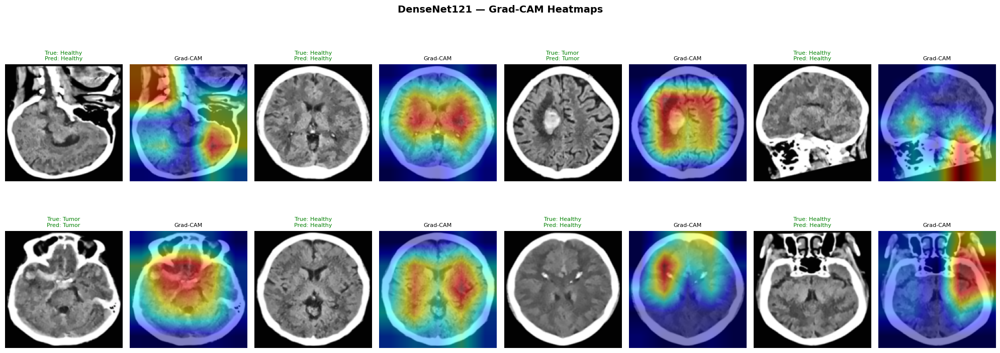

Grad-CAM complete for DenseNet121


In [37]:
# ============================================================
# DenseNet121 — Evaluate + Grad-CAM
# ============================================================
densenet.load_state_dict(torch.load(history_densenet["save_path"], map_location=device))

eval_densenet = evaluate_model(densenet, test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_densenet, MODEL_NAME)
plot_confusion_matrix(eval_densenet, CLASS_NAMES, MODEL_NAME)
mean_auc_densenet, _ = plot_roc_curves(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_densenet, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(densenet, test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(densenet, MODEL_NAME, densenet.features.denseblock4, test_loader, CLASS_NAMES)

In [38]:
save_model_result("DenseNet121", eval_densenet, history_densenet, mean_auc_densenet)

Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results/DenseNet121_result.json


---
## PHASE 10 — Model 4: InceptionV3

In [39]:
# ============================================================
# InceptionV3 — Dedicated 299x299 DataLoaders
# Root cause: InceptionV3 needs >=299x299 input; our base pipeline
# tensors are 176x176 (176 collapses to too-small spatial dims before
# a 5x5 conv -> RuntimeError). Fix: wrap the existing (already
# normalized) tensors and resize them to 299x299 on the fly.
# ============================================================
INCEPTION_SIZE = 299

class InceptionTensorDataset(torch.utils.data.Dataset):
    """Re-sizes already-normalized tensors to 299x299 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [INCEPTION_SIZE, INCEPTION_SIZE],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

inc_train_data = InceptionTensorDataset(train_dataset)
inc_val_data   = InceptionTensorDataset(val_dataset)
inc_test_data  = InceptionTensorDataset(test_dataset)

inc_train_loader = DataLoader(inc_train_data, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
inc_val_loader   = DataLoader(inc_val_data,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
inc_test_loader  = DataLoader(inc_test_data,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print(f"InceptionV3 loaders ready at {INCEPTION_SIZE}x{INCEPTION_SIZE}")
imgs, _, _ = next(iter(inc_train_loader))
print(f"Batch shape: {imgs.shape}")

InceptionV3 loaders ready at 299x299
Batch shape: torch.Size([32, 3, 299, 299])


In [40]:
# ============================================================
# InceptionV3 — Build Model
# ============================================================
MODEL_NAME = "InceptionV3"

inception = models.inception_v3(
    weights=models.Inception_V3_Weights.IMAGENET1K_V1,
    aux_logits=True
)

# Freeze all; unfreeze Mixed_6e, Mixed_7a-c, fc, AuxLogits
for param in inception.parameters():
    param.requires_grad = False
for name, param in inception.named_parameters():
    if any(k in name for k in ["Mixed_6e", "Mixed_7a", "Mixed_7b", "Mixed_7c", "fc", "AuxLogits"]):
        param.requires_grad = True

# Replace main classifier head
inception.fc = nn.Sequential(
    nn.Linear(inception.fc.in_features, 512),
    nn.ReLU(inplace=True),
    nn.Dropout(0.5),
    nn.Linear(512, NUM_CLASSES)
)

# Replace aux classifier head (required when aux_logits=True)
inception.AuxLogits.fc = nn.Linear(768, NUM_CLASSES)

inception = inception.to(device)
trainable = sum(p.numel() for p in inception.parameters() if p.requires_grad)
print(f"InceptionV3 trainable params: {trainable:,}")

Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 194MB/s]


InceptionV3 trainable params: 18,571,012


In [41]:
# ============================================================
# InceptionV3 — Train (uses 299x299 loaders)
# The shared train_model() engine already unpacks InceptionV3's
# (logits, aux_logits) tuple output and adds the 0.4-weighted
# auxiliary loss automatically.
# ============================================================
criterion_inception = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_inception = optim.AdamW(
    filter(lambda p: p.requires_grad, inception.parameters()),
    lr=3e-4, weight_decay=1e-4
)
scheduler_inception = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_inception, T_max=EPOCHS, eta_min=1e-6
)

history_inception = train_model(
    model=inception, model_name=MODEL_NAME,
    train_loader=inc_train_loader, val_loader=inc_val_loader,
    criterion=criterion_inception, optimizer=optimizer_inception,
    scheduler=scheduler_inception, epochs=EPOCHS
)


 TRAINING: InceptionV3
Epoch [01/20]  Train Loss: 0.5551  Train Acc: 88.43%  Val Loss: 0.2600  Val Acc: 97.40%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.3625  Train Acc: 97.03%  Val Loss: 0.2658  Val Acc: 96.83%
Epoch [03/20]  Train Loss: 0.3193  Train Acc: 98.95%  Val Loss: 0.2422  Val Acc: 98.27%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.3000  Train Acc: 99.66%  Val Loss: 0.2429  Val Acc: 98.12%
Epoch [05/20]  Train Loss: 0.2936  Train Acc: 99.75%  Val Loss: 0.2393  Val Acc: 98.27%
Epoch [06/20]  Train Loss: 0.2914  Train Acc: 99.66%  Val Loss: 0.2373  Val Acc: 98.27%
Epoch [07/20]  Train Loss: 0.2874  Train Acc: 99.97%  Val Loss: 0.2420  Val Acc: 97.98%
Epoch [08/20]  Train Loss: 0.2854  Train Acc: 100.00%  Val Loss: 0.2296  Val Acc: 98.27%
Epoch [09/20]  Train Loss: 0.2836  Train Acc: 100.00%  Val Loss: 0.2228  Val Acc: 98.85%  <- Best Saved (local + Drive)
Epoch [10/20]  Train Loss: 0.2839  Train Acc: 99.94%  Val Loss: 0.2284  Val Acc: 98.70%
E


 TEST EVALUATION: InceptionV3

Test Accuracy : 98.41%
Sensitivity (Tumor recall)   : 97.70%
Specificity (Healthy recall) : 99.13%

Classification Report:

              precision    recall  f1-score   support

     Healthy       0.98      0.99      0.98       345
       Tumor       0.99      0.98      0.98       348

    accuracy                           0.98       693
   macro avg       0.98      0.98      0.98       693
weighted avg       0.98      0.98      0.98       693



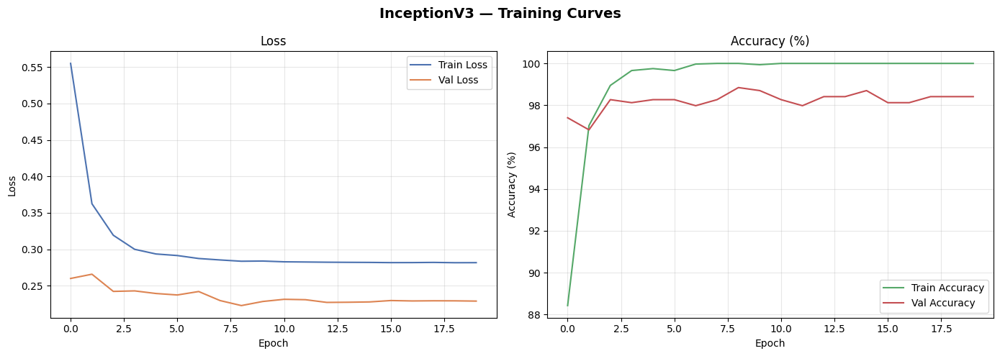

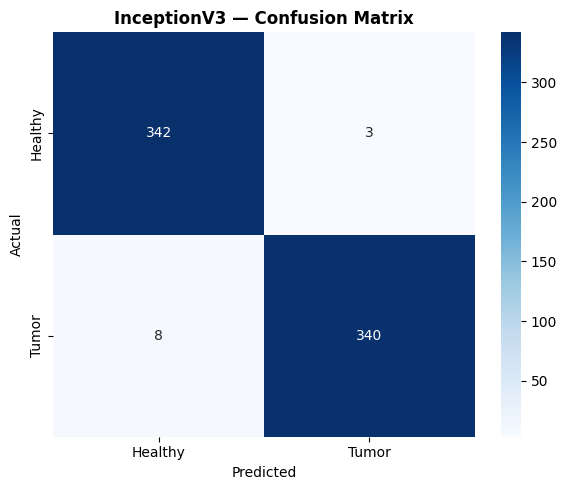

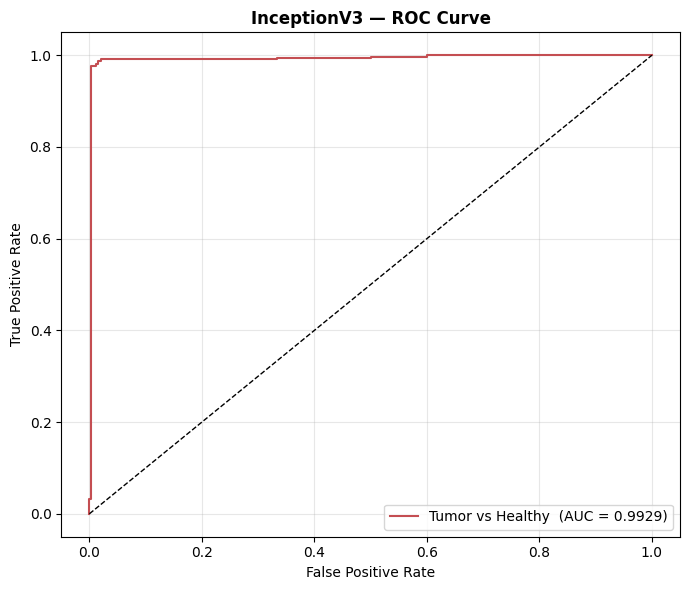

AUC: 0.9929


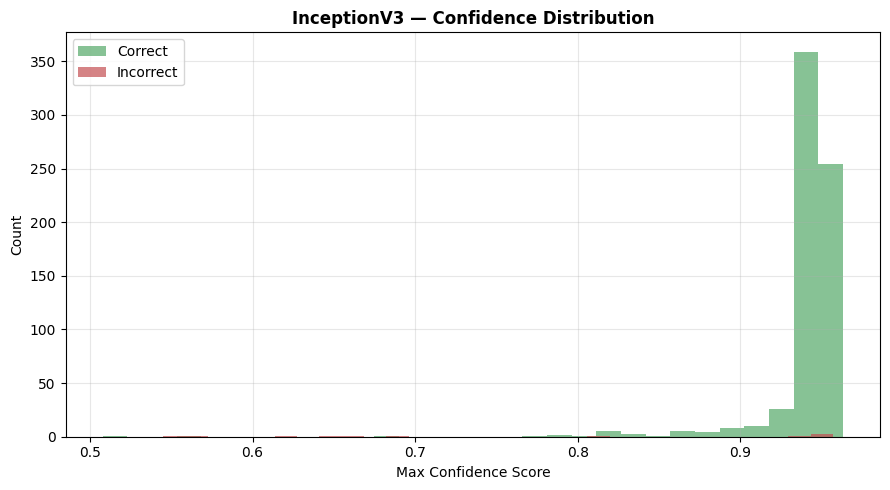

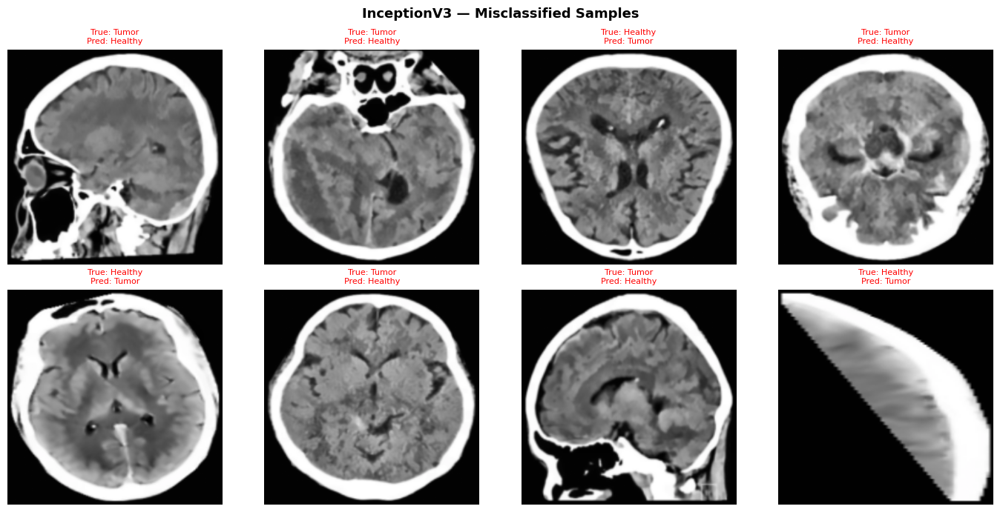

Total misclassified shown: 8


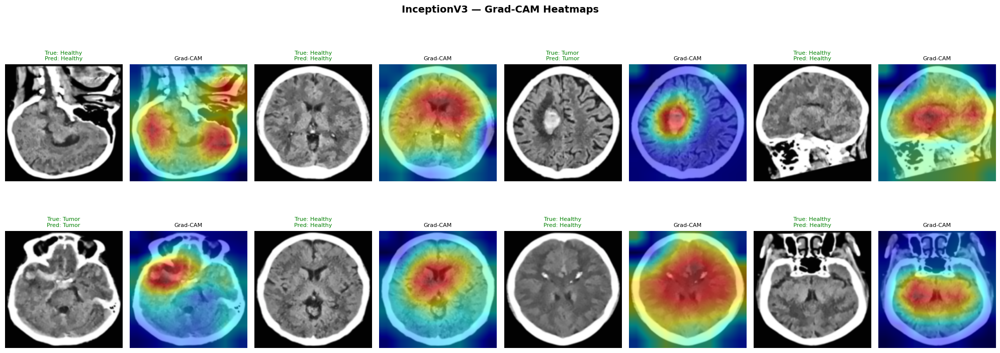

Grad-CAM complete for InceptionV3


In [42]:
# ============================================================
# InceptionV3 — Evaluate + Grad-CAM (uses 299x299 test loader)
# ============================================================
inception.load_state_dict(torch.load(history_inception["save_path"], map_location=device))

eval_inception = evaluate_model(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_inception, MODEL_NAME)
plot_confusion_matrix(eval_inception, CLASS_NAMES, MODEL_NAME)
mean_auc_inception, _ = plot_roc_curves(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_inception, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(inception, inc_test_loader, CLASS_NAMES, MODEL_NAME)

run_gradcam(inception, MODEL_NAME, inception.Mixed_7c, inc_test_loader, CLASS_NAMES)

In [43]:
save_model_result("InceptionV3", eval_inception, history_inception, mean_auc_inception)

Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results/InceptionV3_result.json


---
## PHASE 11 — Model 5: ConvNeXt-Tiny

In [44]:
# ============================================================
# 224x224 DataLoaders — shared by ConvNeXt-Tiny, ViT-Small, and Swin-Tiny
# Root cause: these three architectures are pretrained on 224x224
# ImageNet crops (patch grids need to divide 224 evenly), while our
# base pipeline tensors are 176x176. Wrap the existing (already
# normalized) tensors and resize them on the fly.
# ============================================================
RESIZE_224 = 224

class Resized224Dataset(torch.utils.data.Dataset):
    """Resizes already-normalized tensors to 224x224 on the fly."""
    def __init__(self, base_dataset):
        self.base = base_dataset

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        img, label, path = self.base[idx]
        img = T.functional.resize(img, [RESIZE_224, RESIZE_224],
                                  interpolation=T.InterpolationMode.BILINEAR,
                                  antialias=True)
        return img, label, path

train_data_224 = Resized224Dataset(train_dataset)
val_data_224   = Resized224Dataset(val_dataset)
test_data_224  = Resized224Dataset(test_dataset)

train_loader_224 = DataLoader(train_data_224, batch_size=32, shuffle=True,
                              num_workers=0, collate_fn=standard_collate, drop_last=True)
val_loader_224   = DataLoader(val_data_224,   batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)
test_loader_224  = DataLoader(test_data_224,  batch_size=32, shuffle=False,
                              num_workers=0, collate_fn=standard_collate)

print("224x224 loaders ready (shared by ConvNeXt-Tiny / ViT-Small / Swin-Tiny)")
imgs, _, _ = next(iter(train_loader_224))
print(f"Batch shape: {imgs.shape}")

224x224 loaders ready (shared by ConvNeXt-Tiny / ViT-Small / Swin-Tiny)
Batch shape: torch.Size([32, 3, 224, 224])


In [45]:
# ============================================================
# ConvNeXt-Tiny — Build Model
#
# Overfitting/underfitting considerations:
#   - Backbone is frozen except the LAST stage (stages.3) + head, so
#     most of the ImageNet-pretrained feature hierarchy is preserved
#     (low overfitting risk on a modest CT dataset) while high-level
#     features can still adapt to CT-specific texture.
#   - drop_path_rate=0.1 adds stochastic depth regularization, which
#     ConvNeXt was designed to use during fine-tuning.
# ============================================================
MODEL_NAME = "ConvNeXt_Tiny"

convnext = timm.create_model(
    "convnext_tiny",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_path_rate=0.1
)

for param in convnext.parameters():
    param.requires_grad = False
for name, param in convnext.named_parameters():
    if any(k in name for k in ["stages.3", "head", "norm_pre"]):
        param.requires_grad = True

convnext = convnext.to(device)
trainable = sum(p.numel() for p in convnext.parameters() if p.requires_grad)
print(f"ConvNeXt-Tiny trainable params: {trainable:,}")

model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

ConvNeXt-Tiny trainable params: 15,473,666


In [46]:
# ============================================================
# ConvNeXt-Tiny — Train
# ============================================================
criterion_convnext = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_convnext = optim.AdamW(
    filter(lambda p: p.requires_grad, convnext.parameters()),
    lr=2e-4, weight_decay=1e-4
)
scheduler_convnext = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_convnext, T_max=EPOCHS, eta_min=1e-6
)

history_convnext = train_model(
    model=convnext, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_convnext, optimizer=optimizer_convnext,
    scheduler=scheduler_convnext, epochs=EPOCHS
)


 TRAINING: ConvNeXt_Tiny
Epoch [01/20]  Train Loss: 0.6888  Train Acc: 79.46%  Val Loss: 0.3587  Val Acc: 89.18%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.3343  Train Acc: 92.17%  Val Loss: 0.3011  Val Acc: 93.36%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.2696  Train Acc: 96.19%  Val Loss: 0.2759  Val Acc: 95.53%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.2405  Train Acc: 97.74%  Val Loss: 0.2808  Val Acc: 96.10%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.2338  Train Acc: 98.36%  Val Loss: 0.2736  Val Acc: 96.39%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.2242  Train Acc: 98.76%  Val Loss: 0.2554  Val Acc: 97.55%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.2250  Train Acc: 98.51%  Val Loss: 0.2708  Val Acc: 96.39%
Epoch [08/20]  Train Loss: 0.2177  Train Acc: 98.98%  Val Loss: 0.2522  Val Acc: 97.40%
Epoch [09/20]  Train Loss: 0.2142  Train Acc: 99.13%  Val Loss: 0.2770  Val Acc: 96.


 TEST EVALUATION: ConvNeXt_Tiny

Test Accuracy : 97.98%
Sensitivity (Tumor recall)   : 96.55%
Specificity (Healthy recall) : 99.42%

Classification Report:

              precision    recall  f1-score   support

     Healthy       0.97      0.99      0.98       345
       Tumor       0.99      0.97      0.98       348

    accuracy                           0.98       693
   macro avg       0.98      0.98      0.98       693
weighted avg       0.98      0.98      0.98       693



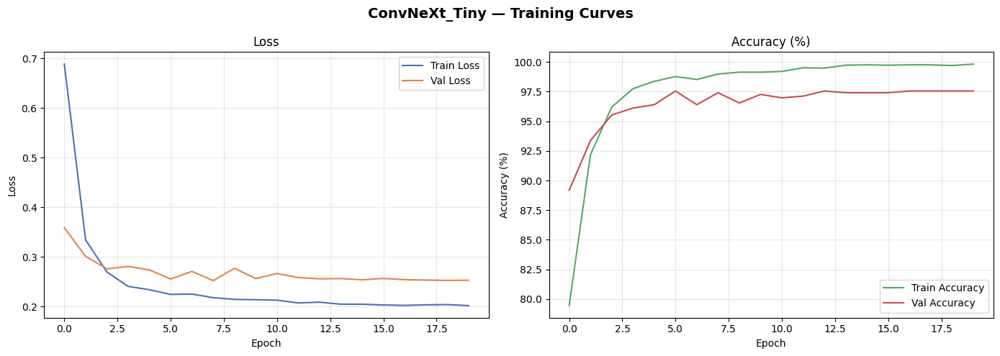

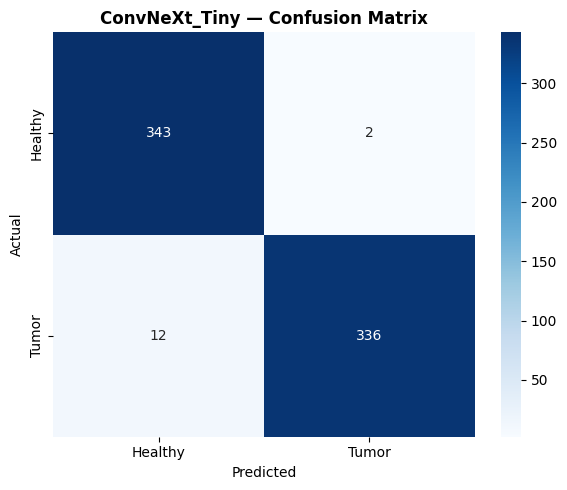

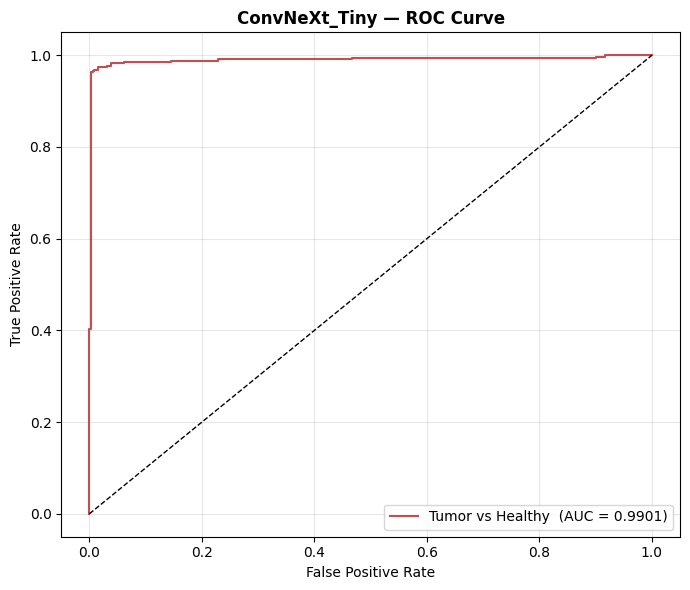

AUC: 0.9901


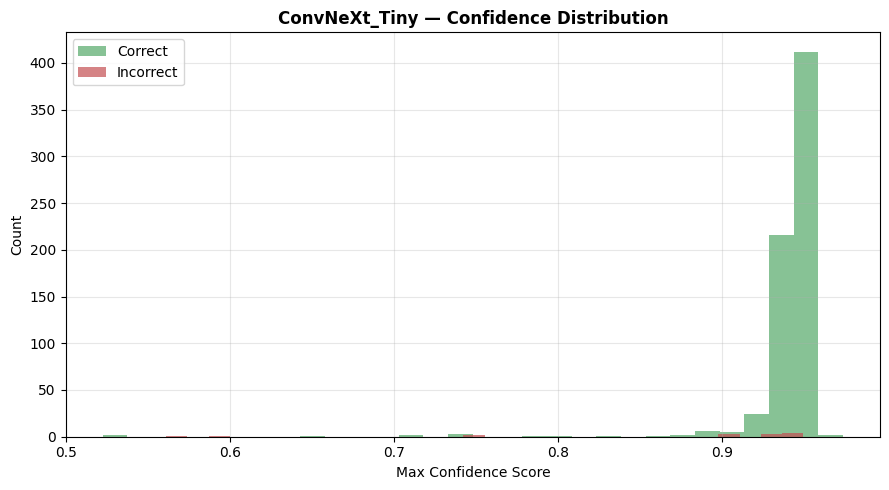

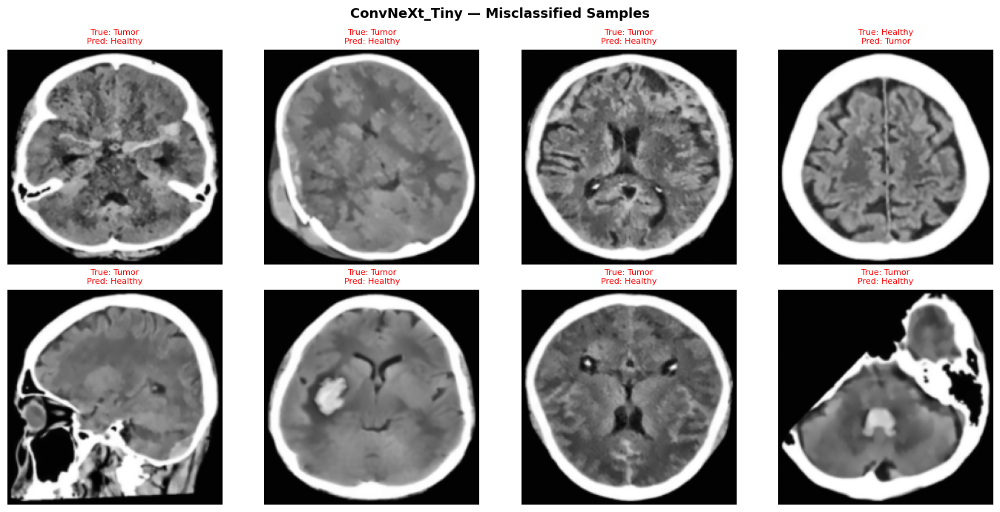

Total misclassified shown: 8


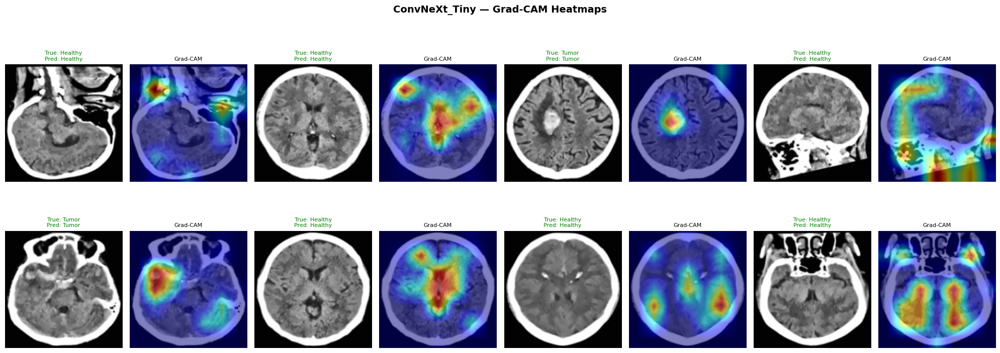

Grad-CAM complete for ConvNeXt_Tiny


In [47]:
# ============================================================
# ConvNeXt-Tiny — Evaluate + Grad-CAM
# ConvNeXt is a convolutional backbone (not tokens), so Grad-CAM works
# the same way as VGG/DenseNet — no reshape_transform needed.
# ============================================================
convnext.load_state_dict(torch.load(history_convnext["save_path"], map_location=device))

eval_convnext = evaluate_model(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_convnext, MODEL_NAME)
plot_confusion_matrix(eval_convnext, CLASS_NAMES, MODEL_NAME)
mean_auc_convnext, _ = plot_roc_curves(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_convnext, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(convnext, test_loader_224, CLASS_NAMES, MODEL_NAME)

run_gradcam(convnext, MODEL_NAME, convnext.stages[-1], test_loader_224, CLASS_NAMES)

In [48]:
save_model_result("ConvNeXt-Tiny", eval_convnext, history_convnext, mean_auc_convnext)

Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results/ConvNeXt_Tiny_result.json


---
## PHASE 12 — Model 6: Vision Transformer (ViT-Small)

In [49]:
# ============================================================
# ViT-Small (patch16, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - vit_small (not vit_base) is used deliberately: fewer parameters
#     means lower overfitting risk on a dataset this size.
#   - Only the last 2 transformer blocks + final norm + head are
#     unfrozen. ViT attention weights are sensitive to fine-tuning.
#   - Learning rate is much lower than the CNN models (5e-5 vs 3e-4):
#     ViTs fine-tune best with a small LR.
# ============================================================
MODEL_NAME = "ViT_Small"

vit = timm.create_model(
    "vit_small_patch16_224", pretrained=True, num_classes=NUM_CLASSES,
    drop_rate=0.2, attn_drop_rate=0.1
)

for param in vit.parameters():
    param.requires_grad = False
for name, param in vit.named_parameters():
    if any(k in name for k in ["blocks.10", "blocks.11", "norm", "head"]):
        param.requires_grad = True

vit = vit.to(device)
trainable = sum(p.numel() for p in vit.parameters() if p.requires_grad)
print(f"ViT-Small trainable params: {trainable:,}")

model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

ViT-Small trainable params: 3,565,826


In [50]:
# ============================================================
# ViT-Small — Train
# ============================================================
criterion_vit = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_vit = optim.AdamW(
    filter(lambda p: p.requires_grad, vit.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_vit = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_vit, T_max=EPOCHS, eta_min=1e-6
)

history_vit = train_model(
    model=vit, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_vit, optimizer=optimizer_vit,
    scheduler=scheduler_vit, epochs=EPOCHS
)


 TRAINING: ViT_Small
Epoch [01/20]  Train Loss: 0.4788  Train Acc: 80.23%  Val Loss: 0.3384  Val Acc: 93.22%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.3573  Train Acc: 90.72%  Val Loss: 0.3137  Val Acc: 94.23%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.3160  Train Acc: 93.60%  Val Loss: 0.2943  Val Acc: 94.52%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.2901  Train Acc: 95.70%  Val Loss: 0.2991  Val Acc: 94.95%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.2742  Train Acc: 96.81%  Val Loss: 0.2999  Val Acc: 95.24%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.2607  Train Acc: 97.49%  Val Loss: 0.2736  Val Acc: 95.67%  <- Best Saved (local + Drive)
Epoch [07/20]  Train Loss: 0.2450  Train Acc: 98.36%  Val Loss: 0.2742  Val Acc: 96.10%  <- Best Saved (local + Drive)
Epoch [08/20]  Train Loss: 0.2352  Train Acc: 98.70%  Val Loss: 0.2645  Val Acc: 96.39%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss:


 TEST EVALUATION: ViT_Small

Test Accuracy : 97.55%
Sensitivity (Tumor recall)   : 96.55%
Specificity (Healthy recall) : 98.55%

Classification Report:

              precision    recall  f1-score   support

     Healthy       0.97      0.99      0.98       345
       Tumor       0.99      0.97      0.98       348

    accuracy                           0.98       693
   macro avg       0.98      0.98      0.98       693
weighted avg       0.98      0.98      0.98       693



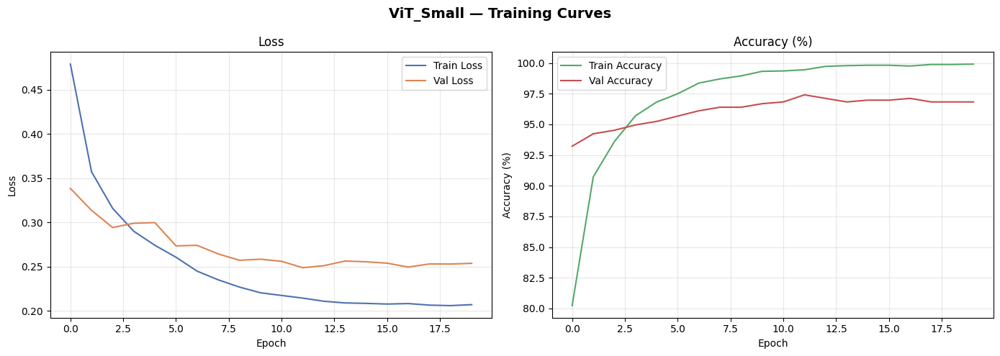

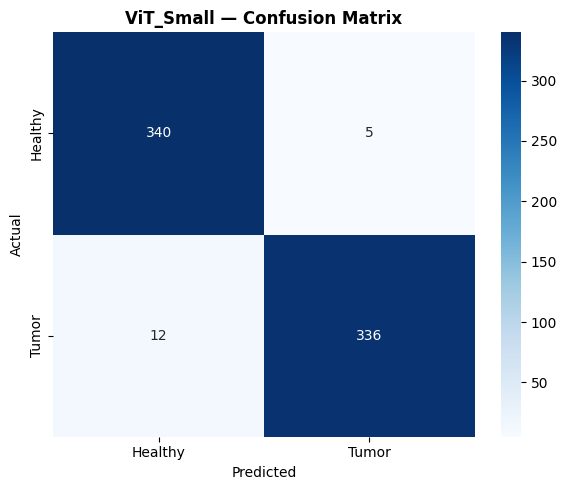

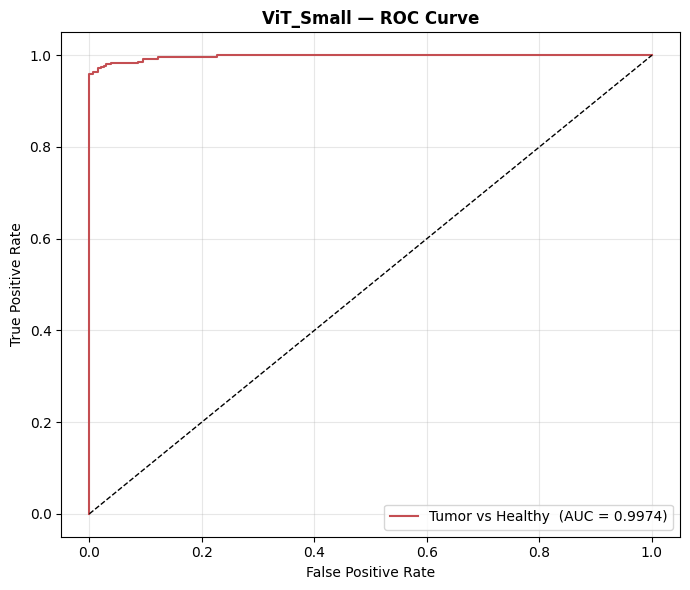

AUC: 0.9974


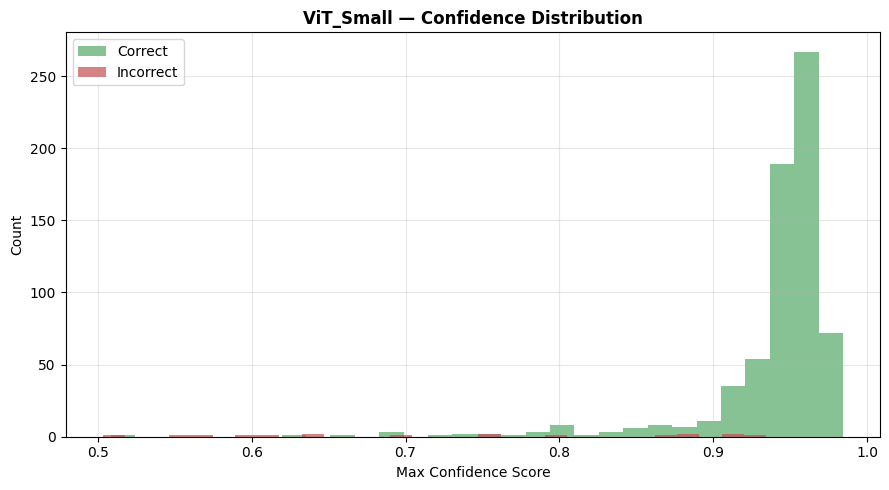

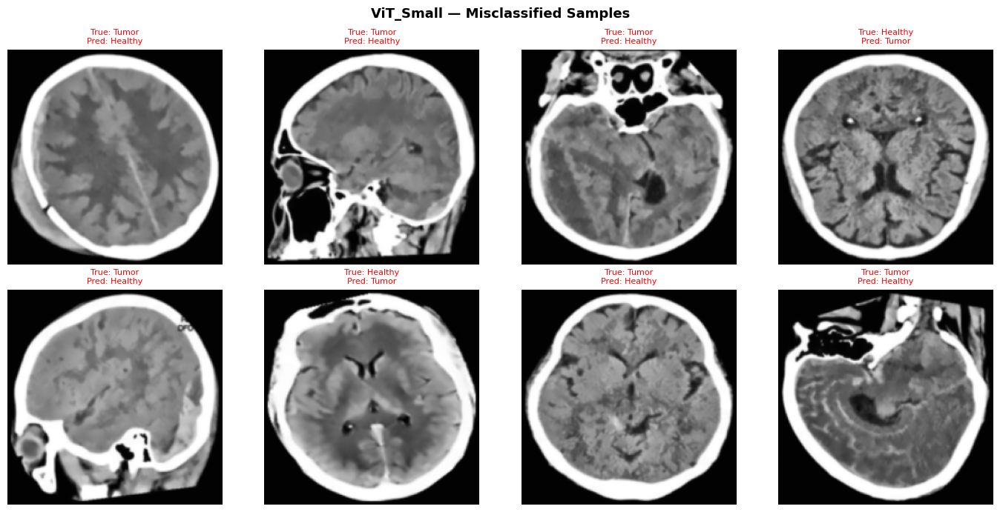

Total misclassified shown: 8


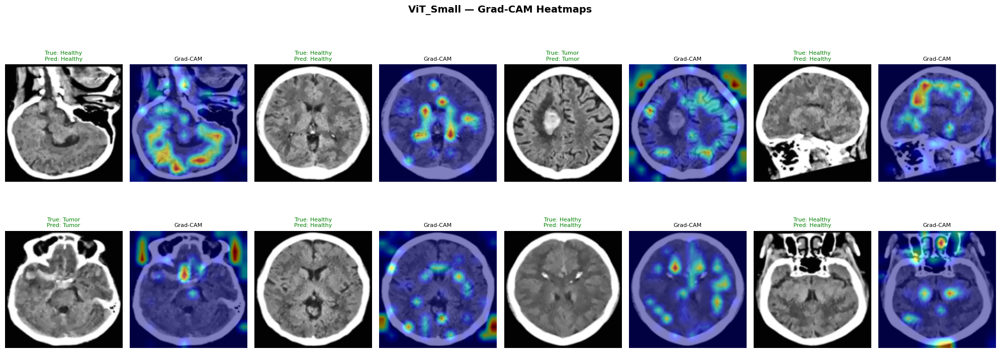

Grad-CAM complete for ViT_Small


In [51]:
# ============================================================
# ViT-Small — Evaluate + Grad-CAM
#
# ViT outputs a (batch, tokens, channels) sequence, not a spatial
# feature map, so standard Grad-CAM can't hook it directly.
# reshape_transform drops the CLS token and folds the remaining
# 14x14=196 patch tokens back into a (batch, channels, 14, 14) map.
# ============================================================
vit.load_state_dict(torch.load(history_vit["save_path"], map_location=device))

eval_vit = evaluate_model(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_vit, MODEL_NAME)
plot_confusion_matrix(eval_vit, CLASS_NAMES, MODEL_NAME)
mean_auc_vit, _ = plot_roc_curves(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_vit, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(vit, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_vit(tensor, height=14, width=14):
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)
    return result

run_gradcam(vit, MODEL_NAME, vit.blocks[-1].norm1, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_vit)

In [52]:
save_model_result("ViT-Small", eval_vit, history_vit, mean_auc_vit)

Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results/ViT_Small_result.json


---
## PHASE 13 — Model 7: Swin Transformer (Swin-Tiny)

In [53]:
# ============================================================
# Swin-Tiny (patch4, window7, 224) — Build Model
#
# Overfitting/underfitting considerations:
#   - Only the last stage (layers.3) + final norm + head are unfrozen,
#     same reasoning as ConvNeXt/ViT — Swin's windowed attention in
#     early stages encodes fairly generic local texture that transfers
#     well and doesn't need to be retrained.
#   - Low LR (5e-5), same rationale as ViT: Swin is also a transformer
#     and is sensitive to aggressive fine-tuning LRs.
# ============================================================
MODEL_NAME = "Swin_Tiny"

swin = timm.create_model(
    "swin_tiny_patch4_window7_224",
    pretrained=True,
    num_classes=NUM_CLASSES,
    drop_rate=0.2,
    drop_path_rate=0.1
)

for param in swin.parameters():
    param.requires_grad = False
for name, param in swin.named_parameters():
    if any(k in name for k in ["layers.3", "norm", "head"]):
        param.requires_grad = True

swin = swin.to(device)
trainable = sum(p.numel() for p in swin.parameters() if p.requires_grad)
print(f"Swin-Tiny trainable params: {trainable:,}")

model.safetensors:   0%|          | 0.00/114M [00:00<?, ?B/s]

Swin-Tiny trainable params: 15,383,666


In [54]:
# ============================================================
# Swin-Tiny — Train
# ============================================================
criterion_swin = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_swin = optim.AdamW(
    filter(lambda p: p.requires_grad, swin.parameters()),
    lr=5e-5, weight_decay=1e-4
)
scheduler_swin = optim.lr_scheduler.CosineAnnealingLR(
    optimizer_swin, T_max=EPOCHS, eta_min=1e-6
)

history_swin = train_model(
    model=swin, model_name=MODEL_NAME,
    train_loader=train_loader_224, val_loader=val_loader_224,
    criterion=criterion_swin, optimizer=optimizer_swin,
    scheduler=scheduler_swin, epochs=EPOCHS
)


 TRAINING: Swin_Tiny
Epoch [01/20]  Train Loss: 0.4569  Train Acc: 82.46%  Val Loss: 0.4017  Val Acc: 88.31%  <- Best Saved (local + Drive)
Epoch [02/20]  Train Loss: 0.3391  Train Acc: 92.17%  Val Loss: 0.3060  Val Acc: 94.37%  <- Best Saved (local + Drive)
Epoch [03/20]  Train Loss: 0.2897  Train Acc: 95.39%  Val Loss: 0.2805  Val Acc: 95.53%  <- Best Saved (local + Drive)
Epoch [04/20]  Train Loss: 0.2623  Train Acc: 96.69%  Val Loss: 0.2758  Val Acc: 95.82%  <- Best Saved (local + Drive)
Epoch [05/20]  Train Loss: 0.2438  Train Acc: 97.52%  Val Loss: 0.2601  Val Acc: 96.54%  <- Best Saved (local + Drive)
Epoch [06/20]  Train Loss: 0.2345  Train Acc: 98.21%  Val Loss: 0.2536  Val Acc: 96.39%
Epoch [07/20]  Train Loss: 0.2268  Train Acc: 98.61%  Val Loss: 0.2613  Val Acc: 96.25%
Epoch [08/20]  Train Loss: 0.2188  Train Acc: 99.13%  Val Loss: 0.2493  Val Acc: 96.83%  <- Best Saved (local + Drive)
Epoch [09/20]  Train Loss: 0.2179  Train Acc: 99.20%  Val Loss: 0.2501  Val Acc: 97.26% 


 TEST EVALUATION: Swin_Tiny

Test Accuracy : 98.70%
Sensitivity (Tumor recall)   : 97.99%
Specificity (Healthy recall) : 99.42%

Classification Report:

              precision    recall  f1-score   support

     Healthy       0.98      0.99      0.99       345
       Tumor       0.99      0.98      0.99       348

    accuracy                           0.99       693
   macro avg       0.99      0.99      0.99       693
weighted avg       0.99      0.99      0.99       693



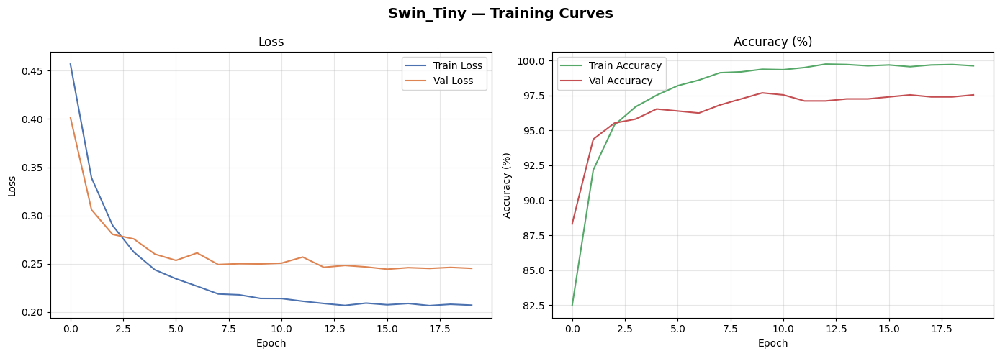

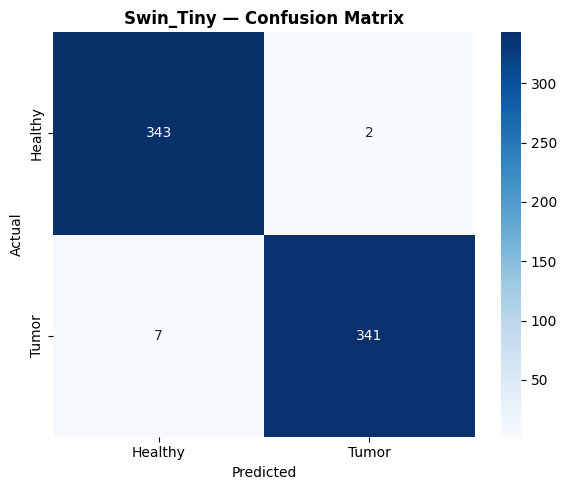

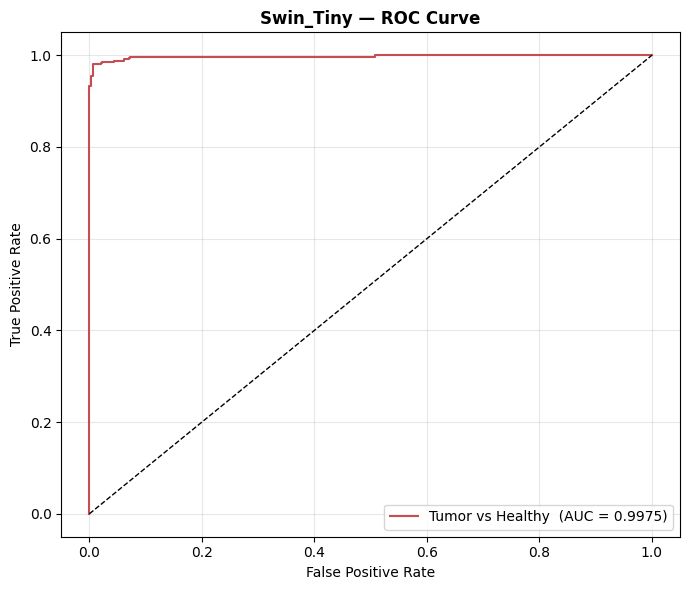

AUC: 0.9975


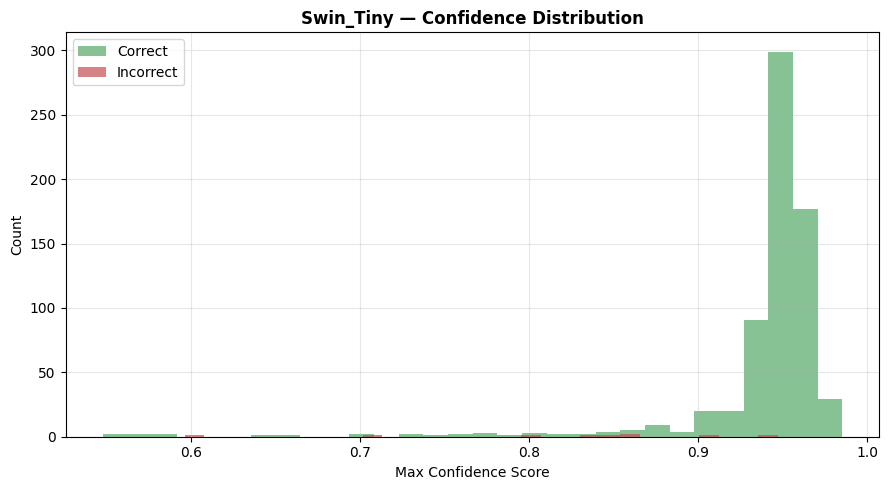

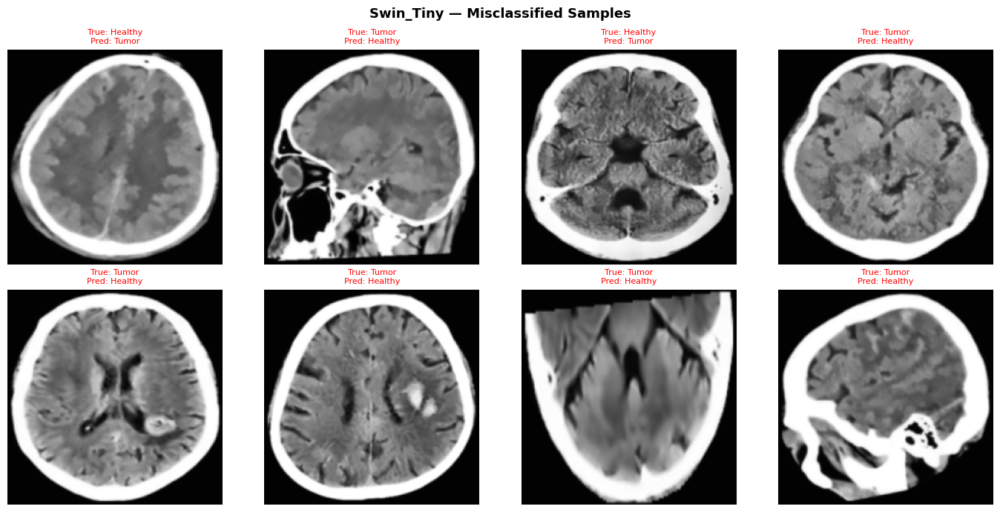

Total misclassified shown: 8


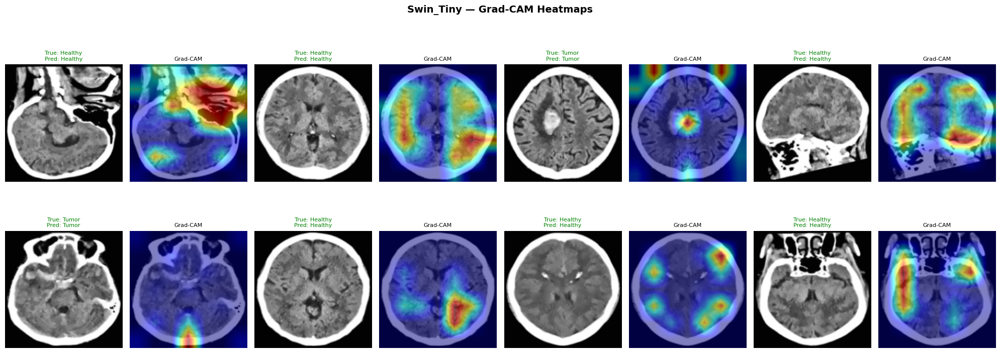

Grad-CAM complete for Swin_Tiny


In [55]:
# ============================================================
# Swin-Tiny — Evaluate + Grad-CAM
#
# Like ViT, Swin's final stage outputs (batch, tokens, channels) with
# no CLS token — at 224 input with window7/patch4, the last stage
# resolution is 7x7=49 tokens. reshape_transform folds these back
# into a (batch, channels, 7, 7) map.
# ============================================================
swin.load_state_dict(torch.load(history_swin["save_path"], map_location=device))

eval_swin = evaluate_model(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)
plot_training_curves(history_swin, MODEL_NAME)
plot_confusion_matrix(eval_swin, CLASS_NAMES, MODEL_NAME)
mean_auc_swin, _ = plot_roc_curves(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_confidence_distribution(eval_swin, CLASS_NAMES, MODEL_NAME)
plot_error_analysis(swin, test_loader_224, CLASS_NAMES, MODEL_NAME)

def reshape_transform_swin(tensor, height=7, width=7):
    result = tensor.reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)  # -> (B, C, H, W)
    return result

run_gradcam(swin, MODEL_NAME, swin.layers[-1].blocks[-1].norm2, test_loader_224, CLASS_NAMES,
            reshape_transform=reshape_transform_swin)

In [56]:
save_model_result("Swin-Tiny", eval_swin, history_swin, mean_auc_swin)

Saved -> /content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models/results/Swin_Tiny_result.json


---
## PHASE 14 — Model Comparison Dashboard

In [57]:
# ============================================================
# Rebuild comparison from saved JSON results on Drive — works in a
# brand-new runtime, no retraining needed.
# ============================================================
df_comparison = load_all_model_results()
df_comparison["Rank"] = df_comparison["Test Accuracy (%)"].rank(ascending=False).astype(int)
df_comparison = df_comparison.sort_values("Test Accuracy (%)", ascending=False).reset_index(drop=True)

ALL_MODELS = ["VGG16", "VGG19", "DenseNet121", "InceptionV3", "ConvNeXt-Tiny", "ViT-Small", "Swin-Tiny"]

print("\n" + "="*90)
print(" MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)")
print(f" Models found: {len(df_comparison)} / 7")
if len(df_comparison) < 7:
    missing = set(ALL_MODELS) - set(df_comparison["Model"])
    print(f" Still missing: {sorted(missing)}")
print("="*90)
print(df_comparison.to_string(index=False))
print("="*90)
best = df_comparison.iloc[0]
print(f"\n  BEST MODEL   : {best['Model']}")
print(f"  Test Accuracy: {best['Test Accuracy (%)']:.2f}%")
print(f"  Sensitivity  : {best['Sensitivity (%)']:.2f}%")
print(f"  Specificity  : {best['Specificity (%)']:.2f}%")
print(f"  Mean AUC     : {best['Mean AUC']:.4f}")
print("="*90)


 MODEL COMPARISON SUMMARY  (sorted by Test Accuracy)
 Models found: 7 / 7
        Model  Test Accuracy (%)  Sensitivity (%)  Specificity (%)  Mean AUC  Training Time (min)  Best Val Acc (%)  Rank
  DenseNet121          98.845599        98.275862        99.420290  0.997043             5.263652         98.268398     1
    Swin-Tiny          98.701299        97.988506        99.420290  0.997501             8.766701         97.691198     2
  InceptionV3          98.412698        97.701149        99.130435  0.992920             7.593655         98.845599     3
ConvNeXt-Tiny          97.979798        96.551724        99.420290  0.990130             5.283658         97.546898     4
    ViT-Small          97.546898        96.551724        98.550725  0.997385             5.388410         97.402597     5
        VGG19          96.536797        95.114943        97.971014  0.986015             8.857078         96.825397     6
        VGG16          96.103896        94.827586        97.391304  0.9

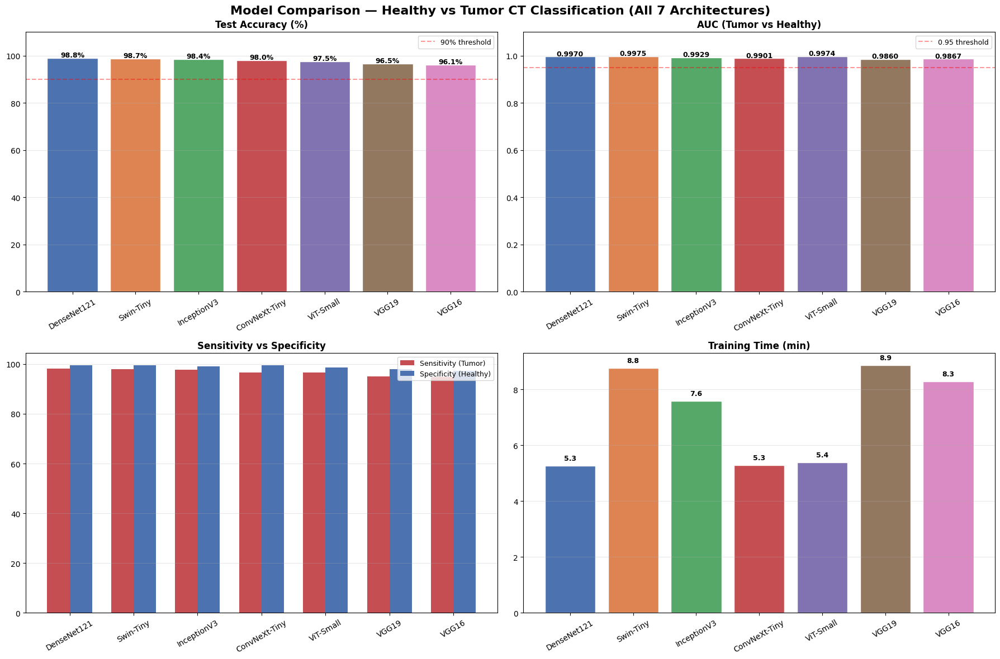

Comparison dashboard + CSV saved to Google Drive.
PHASE 14 COMPLETED

BEST MODEL: DenseNet121
  Accuracy : 98.85%
  Mean AUC : 0.9970


In [58]:
# ============================================================
# Comparison Visualization — 4-panel dashboard (7 models)
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
fig.suptitle("Model Comparison — Healthy vs Tumor CT Classification (All 7 Architectures)",
             fontsize=16, fontweight='bold')

colors = ['#4C72B0','#DD8452','#55A868','#C44E52','#8172B2','#937860','#DA8BC3']
models_sorted = df_comparison["Model"].tolist()
bar_colors = colors[:len(models_sorted)]

ax = axes[0, 0]
bars = ax.bar(models_sorted, df_comparison["Test Accuracy (%)"], color=bar_colors, edgecolor='white')
ax.set_title("Test Accuracy (%)", fontweight='bold')
ax.set_ylim(0, 110)
ax.axhline(y=90, color='red', linestyle='--', alpha=0.4, label='90% threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3); ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Test Accuracy (%)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.5,
            f'{val:.1f}%', ha='center', fontsize=9, fontweight='bold')

ax = axes[0, 1]
bars = ax.bar(models_sorted, df_comparison["Mean AUC"], color=bar_colors, edgecolor='white')
ax.set_title("AUC (Tumor vs Healthy)", fontweight='bold')
ax.set_ylim(0, 1.1)
ax.axhline(y=0.95, color='red', linestyle='--', alpha=0.4, label='0.95 threshold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3); ax.legend(fontsize=9)
for bar, val in zip(bars, df_comparison["Mean AUC"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
            f'{val:.4f}', ha='center', fontsize=9, fontweight='bold')

ax = axes[1, 0]
width = 0.35
x = np.arange(len(models_sorted))
ax.bar(x - width/2, df_comparison["Sensitivity (%)"], width, label='Sensitivity (Tumor)', color='#C44E52')
ax.bar(x + width/2, df_comparison["Specificity (%)"], width, label='Specificity (Healthy)', color='#4C72B0')
ax.set_title("Sensitivity vs Specificity", fontweight='bold')
ax.set_xticks(x); ax.set_xticklabels(models_sorted, rotation=30)
ax.grid(axis='y', alpha=0.3); ax.legend(fontsize=9)

ax = axes[1, 1]
bars = ax.bar(models_sorted, df_comparison["Training Time (min)"], color=bar_colors, edgecolor='white')
ax.set_title("Training Time (min)", fontweight='bold')
ax.tick_params(axis='x', rotation=30)
ax.grid(axis='y', alpha=0.3)
for bar, val in zip(bars, df_comparison["Training Time (min)"]):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.2,
            f'{val:.1f}', ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig("/content/model_comparison_dashboard.png", dpi=150, bbox_inches='tight')
plt.show()

# Also save dashboard + CSV to Drive
drive_dir = "/content/drive/MyDrive/defence/project dataset/Tumor MRI & CT Scan/Brain Tumor CT scan Images/saved_models"
os.makedirs(drive_dir, exist_ok=True)
try:
    import shutil as _shutil
    _shutil.copy2("/content/model_comparison_dashboard.png", f"{drive_dir}/model_comparison_dashboard.png")
    df_comparison.to_csv(f"{drive_dir}/model_comparison_results.csv", index=False)
    print("Comparison dashboard + CSV saved to Google Drive.")
except Exception as e:
    print(f"Drive save skipped: {e}")

print("PHASE 14 COMPLETED")
print(f"\nBEST MODEL: {best['Model']}")
print(f"  Accuracy : {best['Test Accuracy (%)']:.2f}%")
print(f"  Mean AUC : {best['Mean AUC']:.4f}")

---
## PHASE 15 — Download All Best Model Weights

In [ ]:
# ============================================================
# Download trained weights (all 7 models)
# ============================================================
from google.colab import files

model_files = [
    "/content/VGG16_best.pth",
    "/content/VGG19_best.pth",
    "/content/DenseNet121_best.pth",
    "/content/InceptionV3_best.pth",
    "/content/ConvNeXt_Tiny_best.pth",
    "/content/ViT_Small_best.pth",
    "/content/Swin_Tiny_best.pth",
]

for f in model_files:
    if os.path.exists(f):
        print(f"Downloading {f} ...")
        files.download(f)
    else:
        print(f"NOT FOUND (not yet trained): {f}")

print("\nAll available model weights downloaded.")

---
## ✅ Pipeline Complete

**Dataset adaptations made for this project:**
- Path set to `.../Tumor MRI & CT Scan/Brain Tumor CT scan Images/{Healthy, Tumor}`
- Binary classification (`NUM_CLASSES = 2`) instead of 4-way MRI subtype classification
- No pre-made train/test split → stratified 70/15/15 split built in Phase 4
- CT-specific artifact handling added in Phase 3: median-blur + Non-Local-Means
  denoising, Otsu-contour skull cropping (removes borders/scanner text), and
  CLAHE contrast normalization — run **before** caching/resizing, and applied
  identically at train and inference time
- Corrupt/unreadable files are detected and skipped automatically while building the tensor cache
- Evaluation reports **sensitivity/specificity** in addition to accuracy/AUC, since for a
  Healthy-vs-Tumor screening task missed tumors (false negatives) matter more than
  overall accuracy

**Same 7 architectures as the MRI notebook** — VGG16, VGG19, DenseNet121, InceptionV3,
ConvNeXt-Tiny, ViT-Small, Swin-Tiny — each with its own resolution-appropriate
DataLoader (176x176 base loader for the CNNs that don\'t need extra resizing, a
dedicated 299x299 loader for InceptionV3, and a shared 224x224 loader for
ConvNeXt-Tiny / ViT-Small / Swin-Tiny).

**Outputs produced per model:**
- Confusion Matrix · Classification Report · Sensitivity/Specificity
- Training & Validation Loss/Accuracy Curves
- ROC Curve + AUC · Confidence Distribution · Misclassified Samples · Grad-CAM Heatmaps

**Phase 14** compares all 7 trained models on Accuracy, AUC, Sensitivity/Specificity, and
Training Time, and reports the best-performing model.